#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [2]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2Reader
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [3]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":102,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [38]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_logits"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2Reader('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.array(data)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32,102)))
emb.size()

torch.Size([32, 400])

In [8]:
emb

tensor([[0.0000, 1.0574, 0.0000,  ..., 0.0000, 2.7789, 0.0000],
        [0.1237, 0.0000, 0.0000,  ..., 0.2615, 0.0000, 0.6141],
        [0.2360, 1.0937, 0.0000,  ..., 0.4780, 1.5550, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.0240, 0.6268],
        [0.0000, 0.0000, 0.6089,  ..., 1.0729, 0.0000, 0.0000],
        [0.0000, 2.2705, 2.1508,  ..., 0.0468, 0.3485, 0.8659]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_400.npz')
video_classes, video_feat = video_data['activity'], video_data['features']

In [15]:
video_feat.shape

(180, 400)

In [16]:
np.unique(video_classes, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [17]:
vid_cls_name = np.unique(video_classes)

In [18]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [19]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 400])

In [20]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [21]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [22]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [23]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [24]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [25]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 102), (16752,))

In [26]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [27]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [28]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [29]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [30]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [31]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 400])

In [32]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [33]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [34]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss - loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [35]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss - loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 261/261 [00:53<00:00,  4.92batch/s, loss=324, accuracy=0.906]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.71batch/s, loss=294]


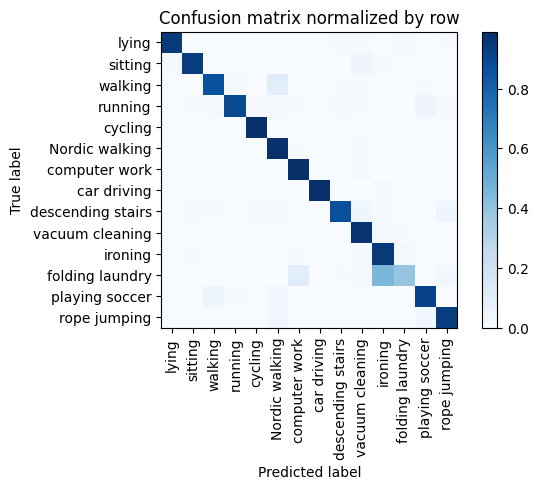

Training Epoch:   7%|▋         | 1/15 [00:59<13:57, 59.80s/it]

Overall accuracy: 0.917

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.953      0.985      0.969      0.144        599|	 vacuum cleaning: 0.012,	ironing: 0.002,	
          ironing       0.812      0.949      0.875      0.118        492|	 folding laundry: 0.020,	vacuum cleaning: 0.018,	
          walking       0.980      0.866      0.920      0.110        456|	 Nordic walking: 0.105,	running: 0.011,	
            lying       0.989      0.951      0.970      0.094        391|	 vacuum cleaning: 0.013,	folding laundry: 0.010,	
   Nordic walking       0.854      0.983      0.914      0.084        351|	 vacuum cleaning: 0.011,	computer work: 0.006,	
          sitting       0.976      0.937      0.956      0.084        351|	 vacuum cleaning: 0.040,	lying: 0.011,	
          cycling       0.984      0.988      0.986      0.077        321|	 rope jumping: 0.003,	folding laundry: 0.003,	
  vacuum cleaning       0.848      0.96


train: 100%|██████████| 261/261 [00:55<00:00,  4.69batch/s, loss=334, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.63batch/s, loss=318]


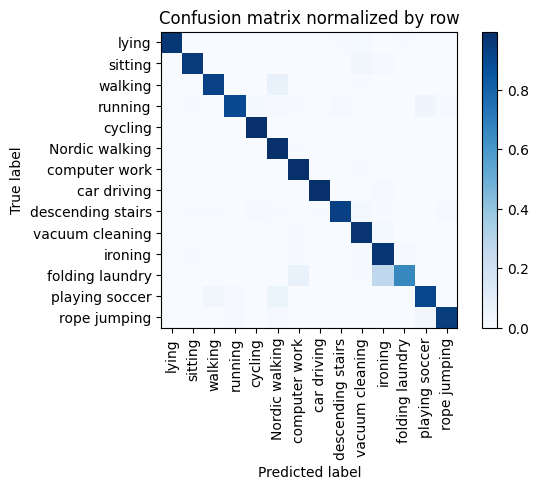

Training Epoch:  13%|█▎        | 2/15 [02:02<13:17, 61.38s/it]

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.964      0.987      0.975      0.144        600|	 vacuum cleaning: 0.005,	ironing: 0.003,	
          ironing       0.877      0.970      0.921      0.120        499|	 folding laundry: 0.010,	vacuum cleaning: 0.010,	
          walking       0.991      0.925      0.957      0.109        454|	 Nordic walking: 0.068,	vacuum cleaning: 0.004,	
            lying       1.000      0.966      0.983      0.093        388|	 vacuum cleaning: 0.015,	folding laundry: 0.008,	
   Nordic walking       0.895      0.994      0.942      0.084        351|	 computer work: 0.006,	rope jumping: 0.000,	
          sitting       0.976      0.951      0.964      0.083        347|	 vacuum cleaning: 0.035,	ironing: 0.009,	
          cycling       0.982      0.994      0.988      0.077        321|	 rope jumping: 0.003,	sitting: 0.003,	
  vacuum cleaning       0.899      0.971


train: 100%|██████████| 261/261 [00:56<00:00,  4.61batch/s, loss=302, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.11batch/s, loss=289]


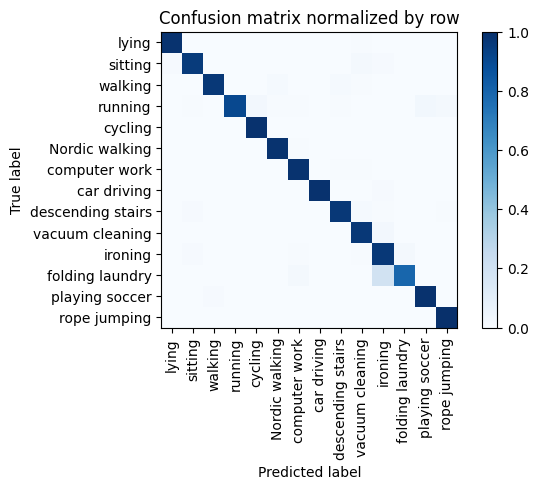

Training Epoch:  20%|██        | 3/15 [03:06<12:29, 62.49s/it]

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.987      0.985      0.144        600|	 vacuum cleaning: 0.005,	descending stairs: 0.005,	
          ironing       0.898      0.966      0.931      0.119        494|	 folding laundry: 0.016,	sitting: 0.008,	
          walking       0.998      0.967      0.982      0.110        456|	 descending stairs: 0.013,	Nordic walking: 0.013,	
            lying       0.985      0.985      0.985      0.094        391|	 vacuum cleaning: 0.008,	ironing: 0.003,	
   Nordic walking       0.980      0.986      0.983      0.085        352|	 computer work: 0.006,	rope jumping: 0.003,	
          sitting       0.968      0.954      0.961      0.084        348|	 vacuum cleaning: 0.023,	lying: 0.011,	
          cycling       0.981      0.991      0.986      0.076        316|	 rope jumping: 0.003,	sitting: 0.003,	
  vacuum cleaning       0.932      0.968      


train: 100%|██████████| 261/261 [00:56<00:00,  4.64batch/s, loss=317, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.10batch/s, loss=302]


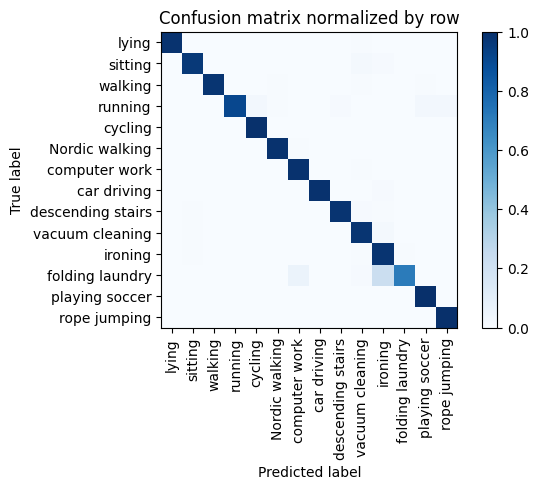

Training Epoch:  27%|██▋       | 4/15 [04:09<11:33, 63.04s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.974      0.988      0.981      0.144        599|	 vacuum cleaning: 0.005,	descending stairs: 0.003,	
          ironing       0.897      0.982      0.938      0.120        498|	 vacuum cleaning: 0.006,	sitting: 0.006,	
          walking       1.000      0.978      0.989      0.108        451|	 vacuum cleaning: 0.007,	Nordic walking: 0.007,	
            lying       0.997      0.987      0.992      0.094        389|	 vacuum cleaning: 0.005,	rope jumping: 0.003,	
   Nordic walking       0.989      0.989      0.989      0.084        350|	 computer work: 0.006,	cycling: 0.003,	
          sitting       0.974      0.963      0.968      0.084        348|	 vacuum cleaning: 0.023,	ironing: 0.009,	
          cycling       0.981      0.994      0.988      0.077        320|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.927      0.9


train: 100%|██████████| 261/261 [00:55<00:00,  4.68batch/s, loss=315, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.98batch/s, loss=299]


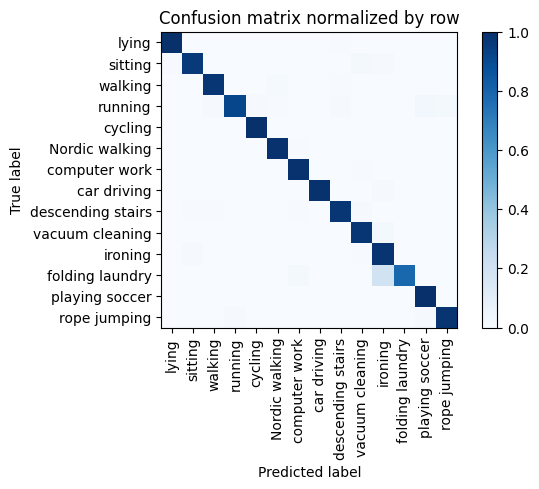

Training Epoch:  33%|███▎      | 5/15 [05:13<10:30, 63.06s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.990      0.988      0.144        599|	 vacuum cleaning: 0.007,	sitting: 0.003,	
          ironing       0.904      0.984      0.942      0.120        498|	 sitting: 0.008,	vacuum cleaning: 0.004,	
          walking       0.993      0.973      0.983      0.108        451|	 Nordic walking: 0.016,	descending stairs: 0.007,	
            lying       0.992      0.992      0.992      0.094        389|	 descending stairs: 0.005,	ironing: 0.003,	
   Nordic walking       0.977      0.989      0.983      0.084        349|	 computer work: 0.006,	vacuum cleaning: 0.003,	
          sitting       0.977      0.960      0.968      0.084        349|	 vacuum cleaning: 0.023,	ironing: 0.009,	
          cycling       0.991      0.994      0.992      0.077        319|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.942      0.975 


train: 100%|██████████| 261/261 [00:58<00:00,  4.48batch/s, loss=290, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.26batch/s, loss=315]


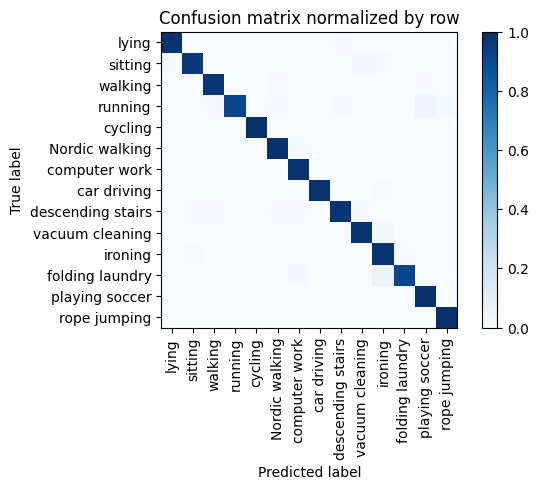

Training Epoch:  40%|████      | 6/15 [06:18<09:34, 63.88s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.992      0.989      0.144        597|	 vacuum cleaning: 0.003,	descending stairs: 0.003,	
          ironing       0.953      0.984      0.968      0.119        496|	 sitting: 0.008,	folding laundry: 0.004,	
          walking       0.995      0.976      0.986      0.109        453|	 Nordic walking: 0.013,	playing soccer: 0.007,	
            lying       0.990      0.990      0.990      0.093        388|	 descending stairs: 0.008,	ironing: 0.003,	
   Nordic walking       0.978      0.994      0.986      0.084        351|	 computer work: 0.006,	rope jumping: 0.000,	
          sitting       0.980      0.957      0.968      0.084        350|	 vacuum cleaning: 0.020,	lying: 0.011,	
          cycling       1.000      0.997      0.998      0.077        321|	 rope jumping: 0.003,	playing soccer: 0.000,	
  vacuum cleaning       0.966      0.978


train: 100%|██████████| 261/261 [00:57<00:00,  4.54batch/s, loss=299, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.30batch/s, loss=302]


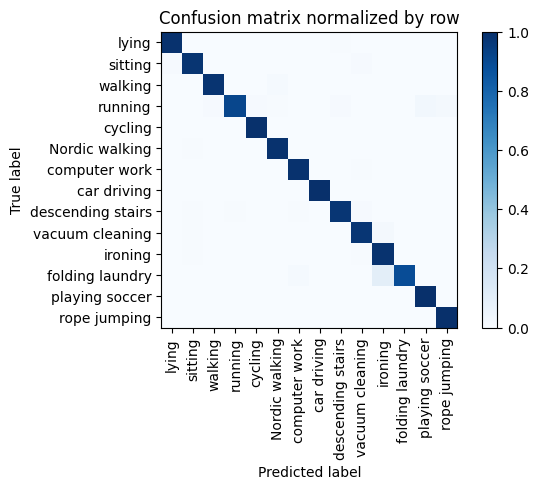

Training Epoch:  47%|████▋     | 7/15 [07:23<08:33, 64.13s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.990      0.992      0.144        598|	 vacuum cleaning: 0.005,	sitting: 0.003,	
          ironing       0.948      0.988      0.968      0.120        499|	 vacuum cleaning: 0.006,	sitting: 0.006,	
          walking       0.996      0.982      0.989      0.109        452|	 Nordic walking: 0.013,	folding laundry: 0.002,	
            lying       0.990      0.990      0.990      0.094        392|	 descending stairs: 0.005,	ironing: 0.003,	
          sitting       0.972      0.977      0.974      0.084        350|	 vacuum cleaning: 0.011,	lying: 0.009,	
   Nordic walking       0.980      0.989      0.984      0.084        348|	 sitting: 0.006,	rope jumping: 0.003,	
          cycling       0.991      0.994      0.992      0.077        320|	 descending stairs: 0.003,	lying: 0.003,	
  vacuum cleaning       0.959      0.974      0.967      0.


train: 100%|██████████| 261/261 [00:58<00:00,  4.45batch/s, loss=317, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.83batch/s, loss=283]


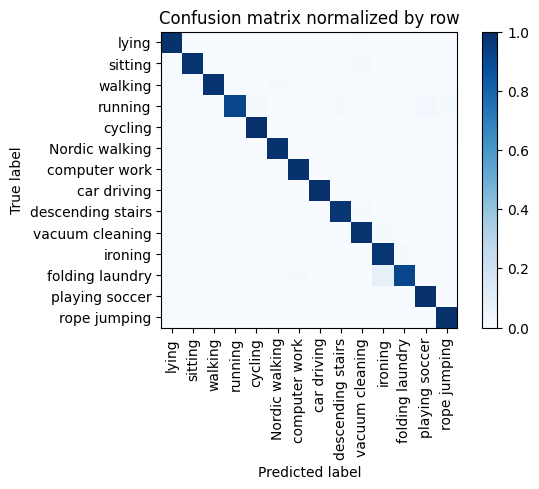

Training Epoch:  53%|█████▎    | 8/15 [08:29<07:33, 64.76s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.990      0.992      0.144        601|	 vacuum cleaning: 0.005,	sitting: 0.003,	
          ironing       0.958      0.974      0.966      0.119        496|	 folding laundry: 0.014,	sitting: 0.006,	
          walking       0.998      0.982      0.990      0.109        454|	 Nordic walking: 0.011,	folding laundry: 0.002,	
            lying       0.997      0.990      0.994      0.094        392|	 vacuum cleaning: 0.005,	ironing: 0.003,	
          sitting       0.983      0.977      0.980      0.084        350|	 vacuum cleaning: 0.014,	ironing: 0.003,	
   Nordic walking       0.983      0.991      0.987      0.084        349|	 folding laundry: 0.003,	computer work: 0.003,	
          cycling       0.981      0.994      0.988      0.077        319|	 rope jumping: 0.006,	playing soccer: 0.000,	
  vacuum cleaning       0.956      0.987      


train: 100%|██████████| 261/261 [00:58<00:00,  4.43batch/s, loss=295, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.72batch/s, loss=291]


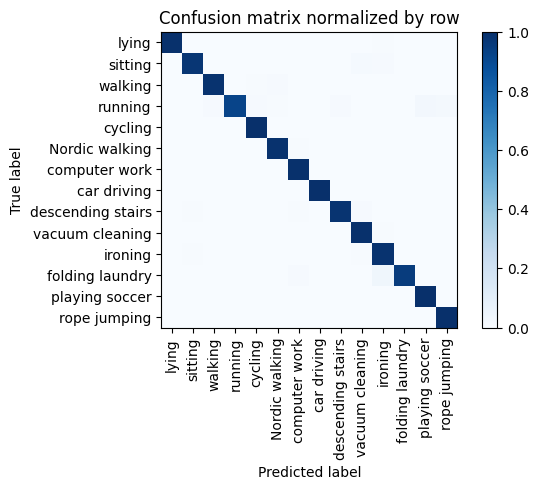

Training Epoch:  60%|██████    | 9/15 [09:35<06:31, 65.27s/it]

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.993      0.143        596|	 vacuum cleaning: 0.003,	folding laundry: 0.002,	
          ironing       0.970      0.988      0.979      0.119        496|	 vacuum cleaning: 0.006,	sitting: 0.006,	
          walking       0.996      0.984      0.990      0.108        451|	 Nordic walking: 0.009,	cycling: 0.004,	
            lying       0.997      0.992      0.995      0.094        390|	 ironing: 0.005,	vacuum cleaning: 0.003,	
   Nordic walking       0.986      0.989      0.987      0.085        352|	 computer work: 0.006,	rope jumping: 0.003,	
          sitting       0.988      0.974      0.981      0.084        350|	 vacuum cleaning: 0.014,	ironing: 0.009,	
          cycling       0.985      0.997      0.991      0.077        320|	 rope jumping: 0.003,	playing soccer: 0.000,	
  vacuum cleaning       0.960      0.994      0.9


train: 100%|██████████| 261/261 [00:59<00:00,  4.39batch/s, loss=283, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.11batch/s, loss=273]


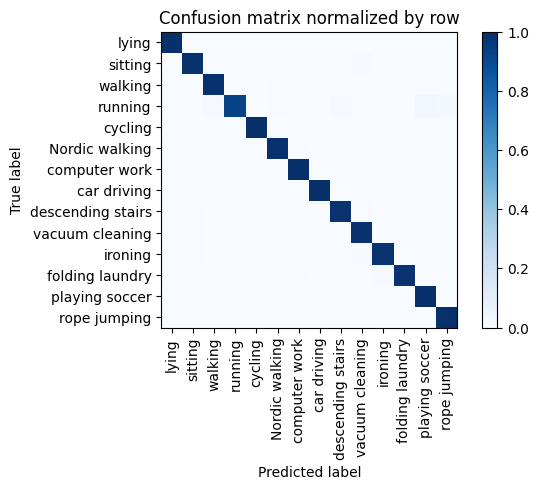

Training Epoch:  67%|██████▋   | 10/15 [10:42<05:28, 65.72s/it]

Overall accuracy: 0.988

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.995      0.995      0.144        600|	 vacuum cleaning: 0.003,	sitting: 0.002,	
          ironing       0.994      0.988      0.991      0.119        496|	 vacuum cleaning: 0.008,	sitting: 0.004,	
          walking       0.996      0.991      0.993      0.109        452|	 Nordic walking: 0.007,	folding laundry: 0.002,	
            lying       0.997      0.997      0.997      0.095        394|	 descending stairs: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.989      0.989      0.989      0.084        351|	 computer work: 0.006,	cycling: 0.003,	
          sitting       0.980      0.989      0.984      0.084        349|	 vacuum cleaning: 0.011,	rope jumping: 0.000,	
          cycling       0.997      0.994      0.995      0.076        317|	 rope jumping: 0.003,	lying: 0.003,	
  vacuum cleaning       0.966      0.990      0.978


train: 100%|██████████| 261/261 [01:00<00:00,  4.31batch/s, loss=283, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.43batch/s, loss=281]


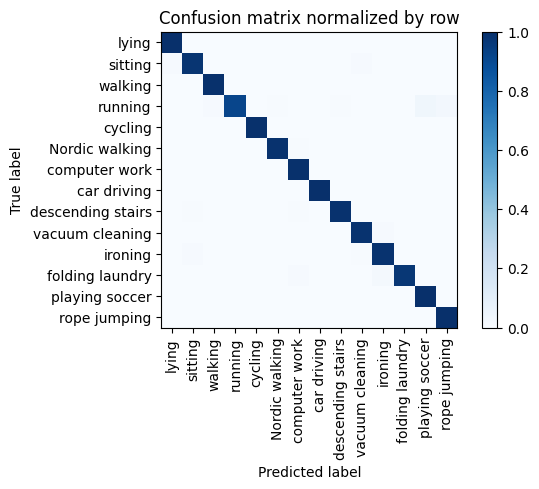

Training Epoch:  73%|███████▎  | 11/15 [11:50<04:26, 66.51s/it]

Overall accuracy: 0.987

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.993      0.144        597|	 vacuum cleaning: 0.003,	sitting: 0.002,	
          ironing       0.986      0.986      0.986      0.120        499|	 sitting: 0.008,	vacuum cleaning: 0.004,	
          walking       0.996      0.993      0.995      0.110        457|	 descending stairs: 0.002,	Nordic walking: 0.002,	
            lying       0.985      0.997      0.991      0.093        388|	 descending stairs: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.994      0.989      0.991      0.084        351|	 computer work: 0.006,	folding laundry: 0.003,	
          sitting       0.980      0.980      0.980      0.084        350|	 lying: 0.011,	vacuum cleaning: 0.009,	
          cycling       0.997      0.994      0.995      0.076        316|	 rope jumping: 0.003,	lying: 0.003,	
  vacuum cleaning       0.978      0.987      0.


train: 100%|██████████| 261/261 [01:00<00:00,  4.32batch/s, loss=289, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.43batch/s, loss=279]


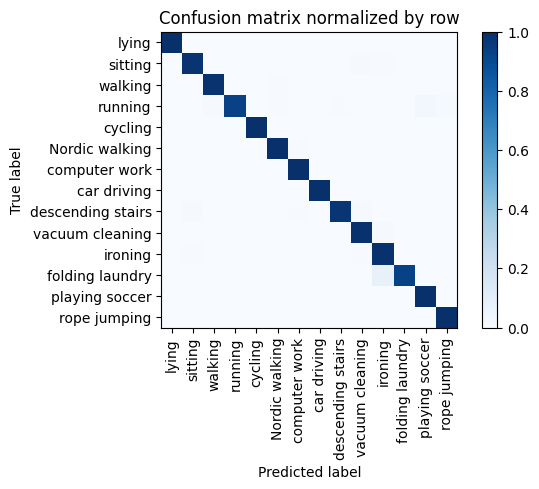

Training Epoch:  80%|████████  | 12/15 [12:58<03:21, 67.02s/it]

Overall accuracy: 0.985

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.997      0.996      0.144        597|	 vacuum cleaning: 0.002,	sitting: 0.002,	
          ironing       0.959      0.990      0.974      0.119        495|	 sitting: 0.006,	vacuum cleaning: 0.004,	
          walking       0.996      0.987      0.991      0.110        456|	 Nordic walking: 0.007,	folding laundry: 0.002,	
            lying       0.995      0.992      0.994      0.094        391|	 folding laundry: 0.003,	ironing: 0.003,	
          sitting       0.983      0.983      0.983      0.084        351|	 vacuum cleaning: 0.009,	ironing: 0.006,	
   Nordic walking       0.989      0.994      0.991      0.084        349|	 computer work: 0.006,	rope jumping: 0.000,	
          cycling       1.000      0.994      0.997      0.077        319|	 rope jumping: 0.003,	lying: 0.003,	
  vacuum cleaning       0.972      0.990      0.981      0


train: 100%|██████████| 261/261 [01:00<00:00,  4.29batch/s, loss=311, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.91batch/s, loss=283]


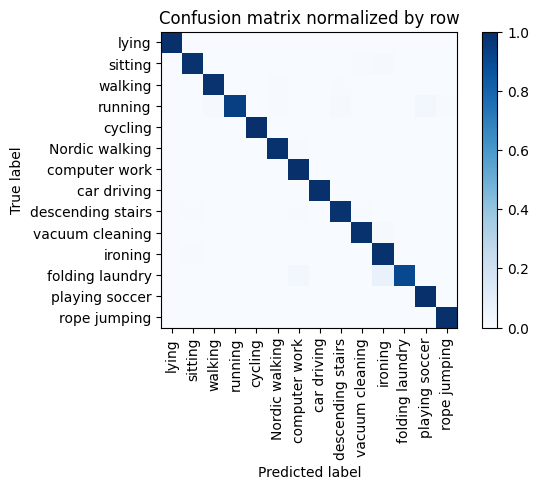

Training Epoch:  87%|████████▋ | 13/15 [14:07<02:14, 67.39s/it]

Overall accuracy: 0.985

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.985      1.000      0.993      0.144        599|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.959      0.992      0.975      0.119        496|	 sitting: 0.006,	vacuum cleaning: 0.002,	
          walking       0.996      0.987      0.991      0.109        454|	 Nordic walking: 0.007,	descending stairs: 0.004,	
            lying       1.000      0.992      0.996      0.094        391|	 ironing: 0.003,	vacuum cleaning: 0.003,	
          sitting       0.986      0.986      0.986      0.084        351|	 ironing: 0.009,	vacuum cleaning: 0.006,	
   Nordic walking       0.989      0.991      0.990      0.083        347|	 computer work: 0.006,	rope jumping: 0.003,	
          cycling       1.000      0.994      0.997      0.077        320|	 folding laundry: 0.003,	descending stairs: 0.003,	
  vacuum cleaning       0.984      0.


train: 100%|██████████| 261/261 [00:54<00:00,  4.77batch/s, loss=302, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.03batch/s, loss=272]


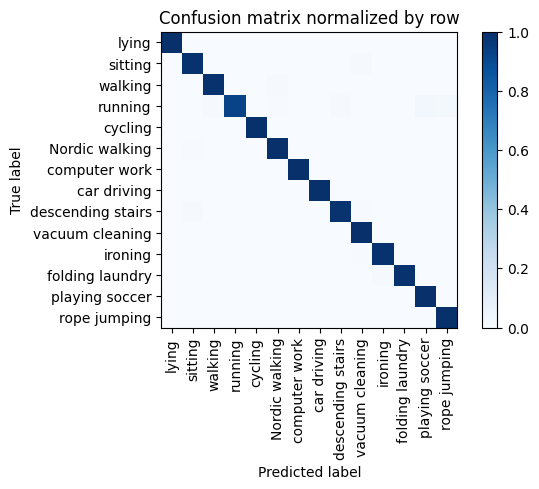

Training Epoch:  93%|█████████▎| 14/15 [15:08<01:05, 65.59s/it]

Overall accuracy: 0.990

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.993      0.997      0.144        600|	 sitting: 0.003,	folding laundry: 0.002,	
          ironing       0.994      0.992      0.993      0.119        495|	 vacuum cleaning: 0.004,	descending stairs: 0.002,	
          walking       0.996      0.989      0.992      0.108        451|	 Nordic walking: 0.009,	folding laundry: 0.002,	
            lying       1.000      0.995      0.997      0.094        392|	 vacuum cleaning: 0.003,	sitting: 0.003,	
          sitting       0.978      0.991      0.984      0.085        352|	 vacuum cleaning: 0.009,	rope jumping: 0.000,	
   Nordic walking       0.986      0.994      0.990      0.084        349|	 sitting: 0.006,	rope jumping: 0.000,	
          cycling       1.000      0.997      0.998      0.077        320|	 rope jumping: 0.003,	playing soccer: 0.000,	
  vacuum cleaning       0.975      0.997


train: 100%|██████████| 261/261 [00:57<00:00,  4.57batch/s, loss=252, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.74batch/s, loss=275]


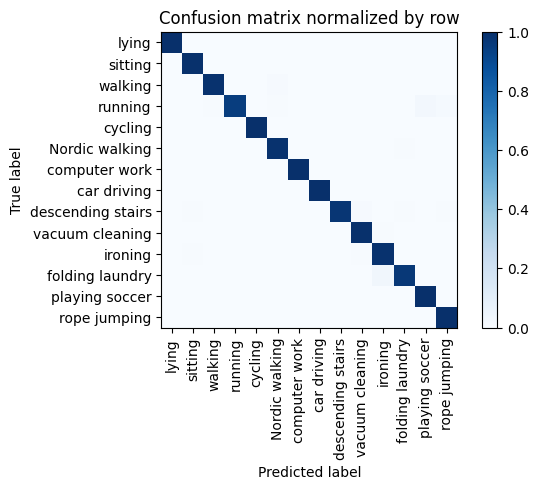

Overall accuracy: 0.990

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.997      0.998      0.144        598|	 folding laundry: 0.003,	rope jumping: 0.000,	
          ironing       0.982      0.990      0.986      0.119        497|	 sitting: 0.006,	vacuum cleaning: 0.004,	
          walking       0.998      0.989      0.993      0.109        455|	 Nordic walking: 0.009,	folding laundry: 0.002,	
            lying       0.997      0.997      0.997      0.094        390|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.986      0.991      0.989      0.084        349|	 folding laundry: 0.006,	rope jumping: 0.003,	
          sitting       0.989      0.994      0.991      0.084        349|	 vacuum cleaning: 0.003,	lying: 0.003,	
          cycling       1.000      0.997      0.998      0.076        317|	 rope jumping: 0.003,	playing soccer: 0.000,	
  vacuum cleaning       0.981      0.99

unseen: 100%|██████████| 87/87 [00:08<00:00, 10.80batch/s, loss=294]


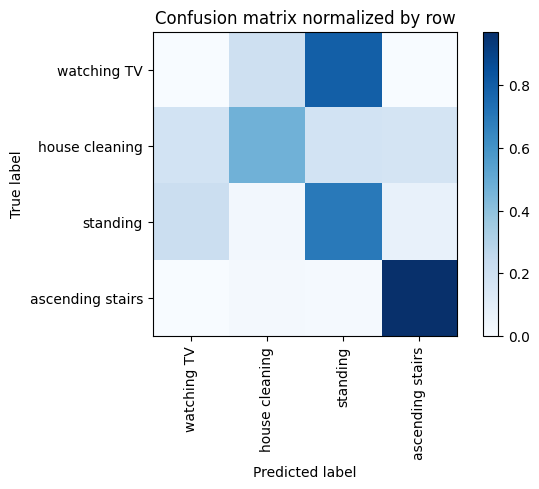

Overall accuracy: 0.571

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.561      0.692      0.620      0.331       1843|	 watching TV: 0.215,	ascending stairs: 0.069,	
  house cleaning       0.790      0.473      0.592      0.328       1828|	 standing: 0.181,	watching TV: 0.179,	
ascending stairs       0.703      0.968      0.815      0.193       1073|	 house cleaning: 0.018,	standing: 0.014,	
     watching TV       0.001      0.001      0.001      0.148        824|	 standing: 0.791,	house cleaning: 0.204,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.581      0.571      0.557        1.0       5568|	      

{'accuracy': 0.5711206896551724, 'precision': 0.5141724486804565, 'recall': 0.5336309664109171, 'f1': 0.5069476948373106}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16]
unseen classes >  [3, 17, 1, 11]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 262/262 [00:56<00:00,  4.67batch/s, loss=293, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.43batch/s, loss=316]


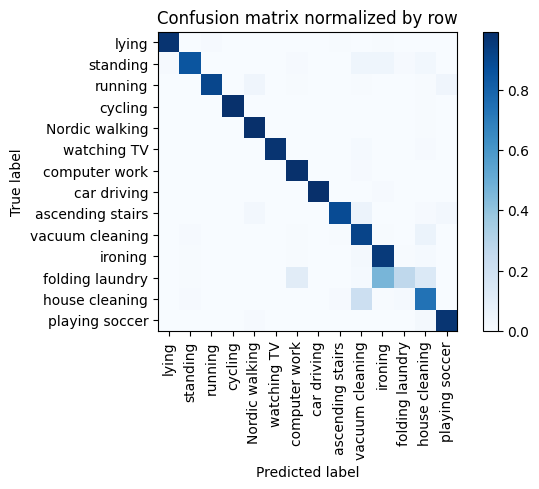

Training Epoch:   7%|▋         | 1/15 [01:03<14:43, 63.10s/it]

Overall accuracy: 0.899

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.948      0.985      0.966      0.148        614|	 vacuum cleaning: 0.008,	standing: 0.003,	
         ironing       0.795      0.952      0.866      0.115        477|	 vacuum cleaning: 0.017,	house cleaning: 0.013,	
        standing       0.964      0.850      0.903      0.090        374|	 ironing: 0.045,	vacuum cleaning: 0.045,	
  Nordic walking       0.963      0.992      0.977      0.088        367|	 house cleaning: 0.005,	vacuum cleaning: 0.003,	
           lying       0.991      0.974      0.983      0.084        349|	 running: 0.009,	ironing: 0.006,	
  house cleaning       0.766      0.738      0.752      0.083        347|	 vacuum cleaning: 0.213,	folding laundry: 0.014,	
 vacuum cleaning       0.714      0.912      0.801      0.082        340|	 house cleaning: 0.062,	standing: 0.009,	
         cycling       1.000      0.987      0.994      


train: 100%|██████████| 262/262 [00:59<00:00,  4.44batch/s, loss=282, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.11batch/s, loss=307]


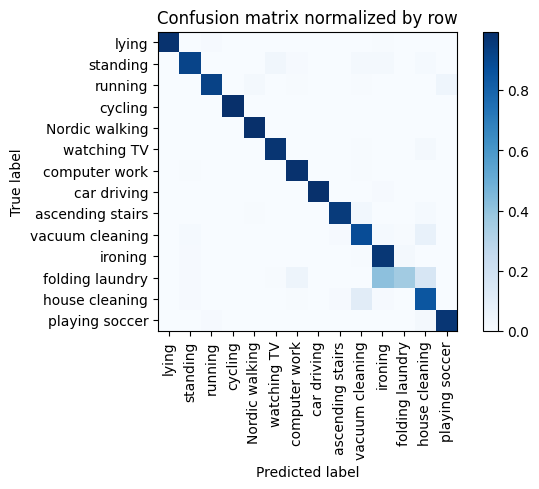

Training Epoch:  13%|█▎        | 2/15 [02:09<14:04, 64.95s/it]

Overall accuracy: 0.923

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.973      0.985      0.979      0.148        614|	 standing: 0.007,	vacuum cleaning: 0.005,	
         ironing       0.821      0.966      0.888      0.114        476|	 folding laundry: 0.017,	standing: 0.008,	
        standing       0.950      0.915      0.932      0.090        376|	 watching TV: 0.032,	ironing: 0.016,	
  Nordic walking       0.984      0.995      0.989      0.088        368|	 house cleaning: 0.003,	cycling: 0.003,	
           lying       1.000      0.980      0.990      0.085        352|	 running: 0.009,	ironing: 0.006,	
  house cleaning       0.797      0.850      0.822      0.083        346|	 vacuum cleaning: 0.110,	ironing: 0.012,	
 vacuum cleaning       0.838      0.882      0.860      0.082        340|	 house cleaning: 0.076,	standing: 0.015,	
         cycling       0.997      0.994      0.995      0.076        315|	 playing


train: 100%|██████████| 262/262 [01:00<00:00,  4.33batch/s, loss=283, accuracy=0.906]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.86batch/s, loss=276]


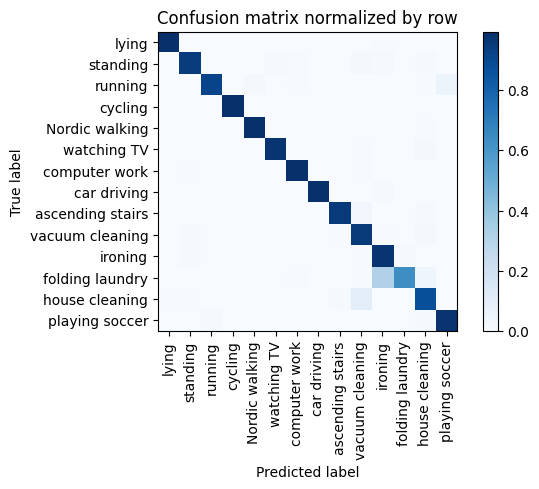

Training Epoch:  20%|██        | 3/15 [03:17<13:15, 66.27s/it]

Overall accuracy: 0.949

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      0.987      0.989      0.148        617|	 vacuum cleaning: 0.005,	standing: 0.005,	
         ironing       0.865      0.975      0.917      0.114        475|	 folding laundry: 0.008,	standing: 0.008,	
        standing       0.967      0.947      0.957      0.090        375|	 vacuum cleaning: 0.016,	watching TV: 0.013,	
  Nordic walking       0.986      0.992      0.989      0.088        366|	 house cleaning: 0.005,	cycling: 0.003,	
           lying       0.994      0.986      0.990      0.085        353|	 ironing: 0.006,	folding laundry: 0.003,	
  house cleaning       0.915      0.875      0.895      0.083        345|	 vacuum cleaning: 0.101,	ascending stairs: 0.009,	
 vacuum cleaning       0.855      0.956      0.903      0.083        344|	 house cleaning: 0.017,	standing: 0.009,	
         cycling       0.997      0.994      0.995      0


train: 100%|██████████| 262/262 [01:01<00:00,  4.26batch/s, loss=284, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.92batch/s, loss=274]


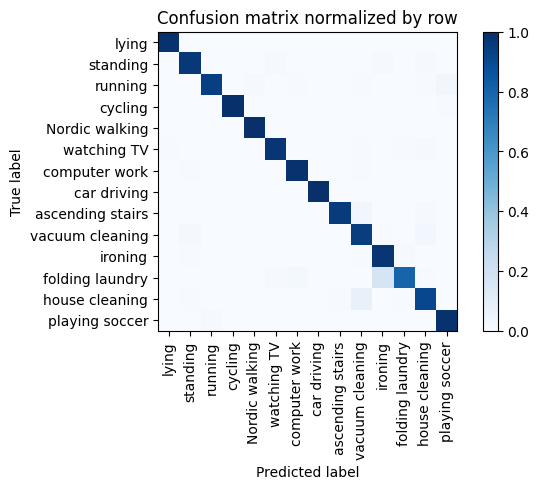

Training Epoch:  27%|██▋       | 4/15 [04:26<12:20, 67.28s/it]

Overall accuracy: 0.963

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.990      0.990      0.990      0.149        618|	 vacuum cleaning: 0.005,	standing: 0.005,	
         ironing       0.923      0.973      0.947      0.115        478|	 folding laundry: 0.010,	standing: 0.006,	
        standing       0.960      0.968      0.964      0.090        373|	 house cleaning: 0.011,	ironing: 0.008,	
  Nordic walking       0.995      0.997      0.996      0.088        365|	 house cleaning: 0.003,	playing soccer: 0.000,	
           lying       0.997      0.992      0.994      0.085        354|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.937      0.908      0.922      0.083        346|	 vacuum cleaning: 0.075,	folding laundry: 0.006,	
 vacuum cleaning       0.887      0.947      0.916      0.082        340|	 house cleaning: 0.024,	standing: 0.018,	
         cycling       1.000      0.994      0.997      0


train: 100%|██████████| 262/262 [01:02<00:00,  4.21batch/s, loss=289, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.68batch/s, loss=282]


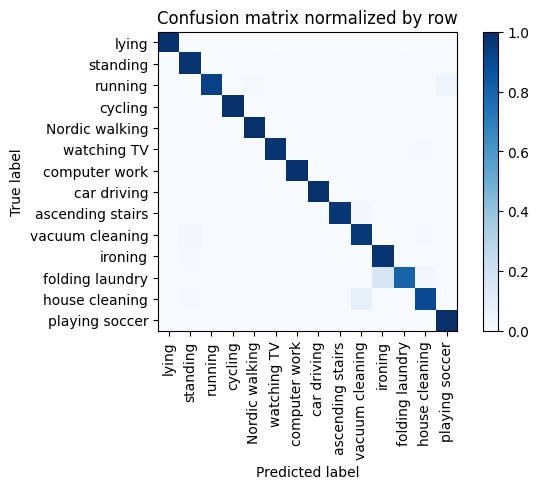

Training Epoch:  33%|███▎      | 5/15 [05:35<11:22, 68.23s/it]

Overall accuracy: 0.968

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.992      0.995      0.148        615|	 vacuum cleaning: 0.005,	standing: 0.003,	
         ironing       0.930      0.981      0.955      0.114        473|	 standing: 0.011,	folding laundry: 0.006,	
        standing       0.953      0.984      0.968      0.089        371|	 folding laundry: 0.005,	watching TV: 0.005,	
  Nordic walking       0.995      0.997      0.996      0.089        369|	 house cleaning: 0.003,	playing soccer: 0.000,	
           lying       0.997      0.992      0.994      0.085        353|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.951      0.901      0.926      0.083        345|	 vacuum cleaning: 0.084,	standing: 0.009,	
 vacuum cleaning       0.890      0.959      0.923      0.081        338|	 standing: 0.018,	house cleaning: 0.015,	
         cycling       0.997      0.997      0.997      0.0


train: 100%|██████████| 262/262 [01:02<00:00,  4.22batch/s, loss=270, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.96batch/s, loss=295]


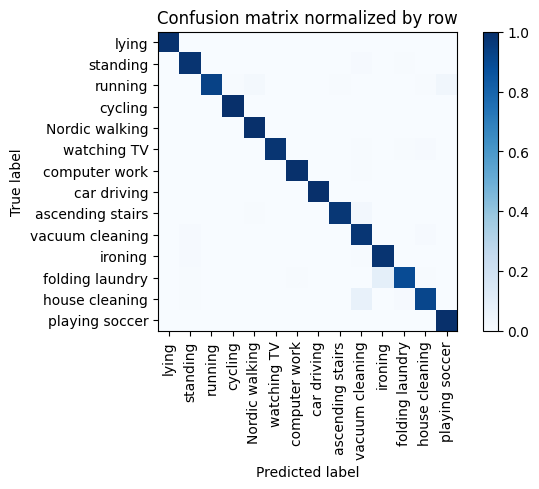

Training Epoch:  40%|████      | 6/15 [06:46<10:20, 68.92s/it]

Overall accuracy: 0.975

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.993      0.996      0.147        613|	 vacuum cleaning: 0.005,	standing: 0.002,	
         ironing       0.961      0.981      0.971      0.115        477|	 standing: 0.010,	vacuum cleaning: 0.004,	
        standing       0.966      0.984      0.975      0.089        372|	 vacuum cleaning: 0.008,	folding laundry: 0.005,	
  Nordic walking       0.987      1.000      0.993      0.089        369|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       0.997      0.992      0.994      0.085        354|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.969      0.913      0.940      0.083        345|	 vacuum cleaning: 0.072,	folding laundry: 0.009,	
 vacuum cleaning       0.895      0.974      0.933      0.082        341|	 house cleaning: 0.009,	standing: 0.009,	
         cycling       0.997      0.997      0.9


train: 100%|██████████| 262/262 [01:03<00:00,  4.10batch/s, loss=307, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.11batch/s, loss=275]


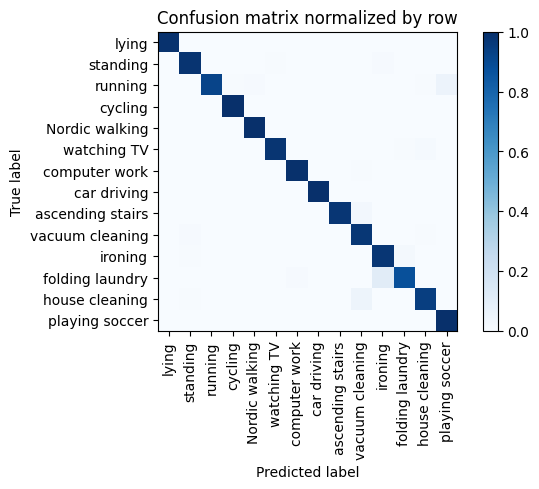

Training Epoch:  47%|████▋     | 7/15 [07:58<09:19, 69.89s/it]

Overall accuracy: 0.975

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.994      0.995      0.148        616|	 vacuum cleaning: 0.005,	standing: 0.002,	
         ironing       0.943      0.973      0.958      0.114        476|	 folding laundry: 0.017,	standing: 0.006,	
        standing       0.971      0.981      0.976      0.090        373|	 ironing: 0.008,	watching TV: 0.005,	
  Nordic walking       0.995      1.000      0.997      0.088        367|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       0.997      0.992      0.994      0.085        354|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.976      0.942      0.959      0.083        347|	 vacuum cleaning: 0.049,	standing: 0.006,	
 vacuum cleaning       0.925      0.971      0.947      0.082        343|	 standing: 0.012,	house cleaning: 0.006,	
         cycling       0.997      0.997      0.997      0.075      


train: 100%|██████████| 262/262 [01:03<00:00,  4.13batch/s, loss=259, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.26batch/s, loss=288]


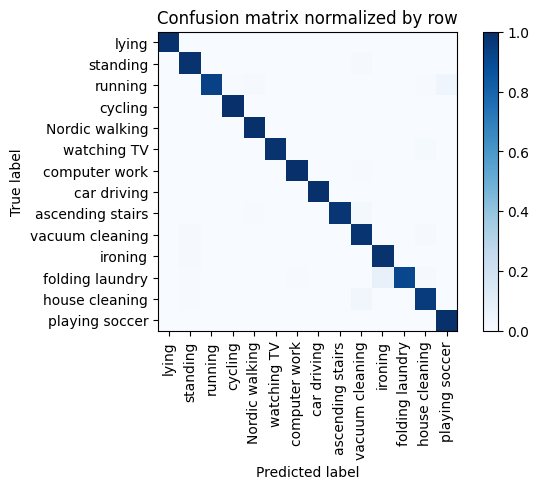

Training Epoch:  53%|█████▎    | 8/15 [09:09<08:12, 70.36s/it]

Overall accuracy: 0.981

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.995      0.997      0.148        616|	 vacuum cleaning: 0.005,	playing soccer: 0.000,	
         ironing       0.969      0.985      0.977      0.113        472|	 standing: 0.008,	house cleaning: 0.002,	
        standing       0.971      0.987      0.979      0.090        373|	 vacuum cleaning: 0.008,	folding laundry: 0.003,	
  Nordic walking       0.992      1.000      0.996      0.088        366|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       1.000      0.992      0.996      0.085        355|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.968      0.956      0.962      0.083        344|	 vacuum cleaning: 0.035,	standing: 0.006,	
 vacuum cleaning       0.936      0.980      0.957      0.082        342|	 house cleaning: 0.009,	standing: 0.009,	
         cycling       0.997      0.994      0.995


train: 100%|██████████| 262/262 [01:03<00:00,  4.10batch/s, loss=297, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.83batch/s, loss=268]


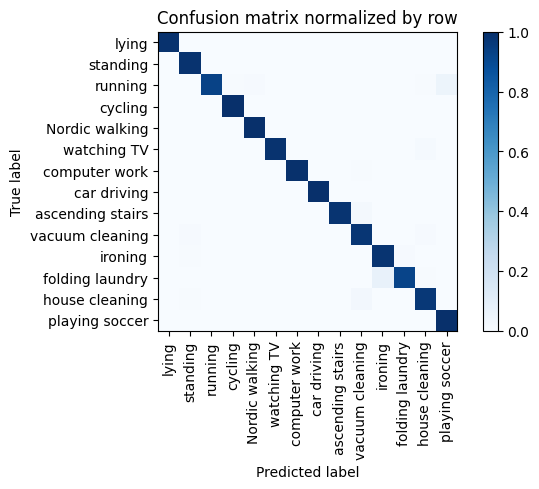

Training Epoch:  60%|██████    | 9/15 [10:21<07:05, 70.90s/it]

Overall accuracy: 0.981

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.995      0.998      0.148        616|	 vacuum cleaning: 0.005,	playing soccer: 0.000,	
         ironing       0.965      0.981      0.973      0.114        475|	 folding laundry: 0.008,	standing: 0.006,	
        standing       0.976      0.987      0.981      0.090        374|	 house cleaning: 0.003,	folding laundry: 0.003,	
  Nordic walking       0.995      1.000      0.997      0.089        369|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       0.997      0.992      0.994      0.085        353|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.968      0.965      0.967      0.083        345|	 vacuum cleaning: 0.026,	standing: 0.006,	
 vacuum cleaning       0.949      0.974      0.961      0.082        342|	 standing: 0.012,	house cleaning: 0.009,	
         cycling       0.997      0.997      0.997


train: 100%|██████████| 262/262 [01:03<00:00,  4.14batch/s, loss=264, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.79batch/s, loss=246]


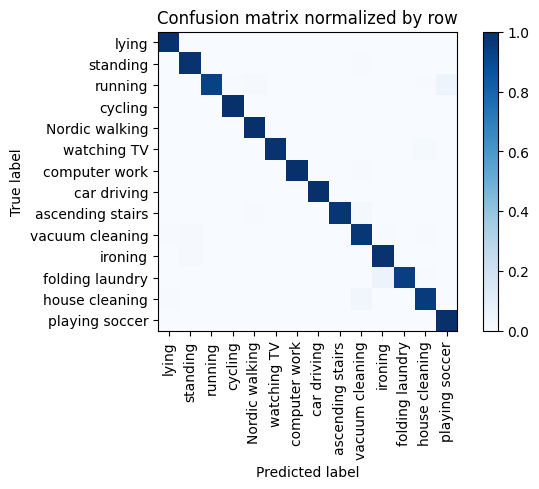

Training Epoch:  67%|██████▋   | 10/15 [11:32<05:54, 70.95s/it]

Overall accuracy: 0.981

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.995      0.998      0.147        613|	 vacuum cleaning: 0.005,	playing soccer: 0.000,	
         ironing       0.969      0.985      0.977      0.115        477|	 standing: 0.008,	house cleaning: 0.002,	
  Nordic walking       0.992      1.000      0.996      0.089        369|	 playing soccer: 0.000,	house cleaning: 0.000,	
        standing       0.976      0.986      0.981      0.089        369|	 vacuum cleaning: 0.005,	folding laundry: 0.003,	
           lying       0.986      0.992      0.989      0.086        356|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.974      0.957      0.965      0.083        347|	 vacuum cleaning: 0.032,	lying: 0.006,	
 vacuum cleaning       0.940      0.971      0.955      0.081        339|	 standing: 0.009,	house cleaning: 0.006,	
         cycling       0.997      0.994      0.995   


train: 100%|██████████| 262/262 [01:03<00:00,  4.11batch/s, loss=258, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.80batch/s, loss=242]


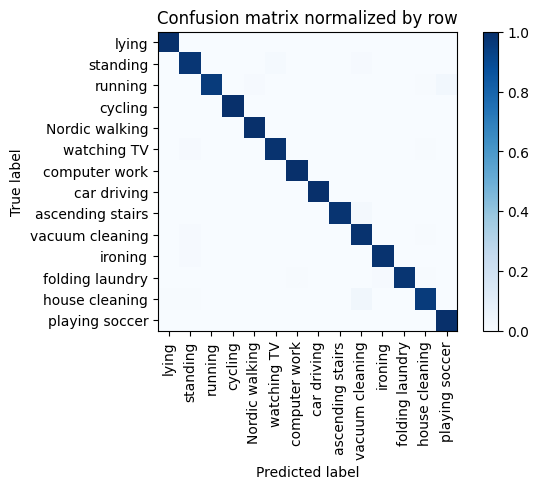

Training Epoch:  73%|███████▎  | 11/15 [12:43<04:44, 71.02s/it]

Overall accuracy: 0.986

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.998      0.998      0.147        612|	 vacuum cleaning: 0.002,	playing soccer: 0.000,	
         ironing       0.994      0.987      0.990      0.114        474|	 standing: 0.011,	folding laundry: 0.002,	
        standing       0.968      0.976      0.972      0.090        375|	 watching TV: 0.013,	vacuum cleaning: 0.008,	
  Nordic walking       0.995      0.997      0.996      0.088        368|	 cycling: 0.003,	playing soccer: 0.000,	
           lying       0.994      0.994      0.994      0.084        350|	 ironing: 0.003,	watching TV: 0.003,	
  house cleaning       0.985      0.954      0.969      0.083        346|	 vacuum cleaning: 0.032,	standing: 0.006,	
 vacuum cleaning       0.946      0.985      0.965      0.081        338|	 standing: 0.009,	house cleaning: 0.006,	
         cycling       0.997      1.000      0.998      0.075  


train: 100%|██████████| 262/262 [01:03<00:00,  4.11batch/s, loss=241, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.50batch/s, loss=275]


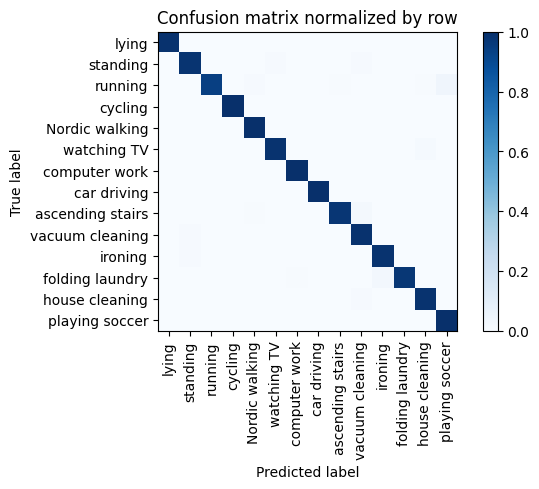

Training Epoch:  80%|████████  | 12/15 [13:55<03:33, 71.15s/it]

Overall accuracy: 0.988

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      1.000      0.999      0.148        614|	 playing soccer: 0.000,	house cleaning: 0.000,	
         ironing       0.987      0.987      0.987      0.114        476|	 standing: 0.008,	vacuum cleaning: 0.002,	
        standing       0.981      0.981      0.981      0.090        375|	 vacuum cleaning: 0.008,	watching TV: 0.008,	
  Nordic walking       0.992      1.000      0.996      0.087        361|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       1.000      0.991      0.996      0.084        351|	 house cleaning: 0.003,	ironing: 0.003,	
  house cleaning       0.983      0.986      0.984      0.084        348|	 vacuum cleaning: 0.011,	folding laundry: 0.003,	
 vacuum cleaning       0.966      0.988      0.977      0.082        342|	 standing: 0.009,	house cleaning: 0.003,	
         cycling       1.000      0.997      0.


train: 100%|██████████| 262/262 [01:05<00:00,  4.02batch/s, loss=270, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.44batch/s, loss=260]


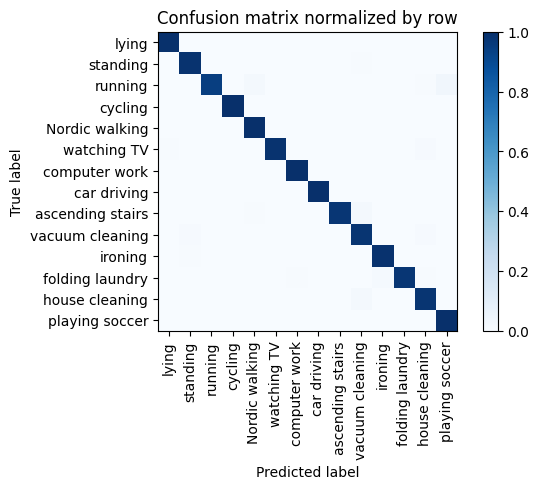

Training Epoch:  87%|████████▋ | 13/15 [15:09<02:23, 71.95s/it]

Overall accuracy: 0.988

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.998      0.998      0.147        613|	 vacuum cleaning: 0.002,	playing soccer: 0.000,	
         ironing       0.987      0.992      0.989      0.114        474|	 standing: 0.006,	folding laundry: 0.002,	
        standing       0.981      0.987      0.984      0.089        371|	 vacuum cleaning: 0.005,	folding laundry: 0.003,	
  Nordic walking       0.989      1.000      0.995      0.089        370|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       0.997      0.994      0.996      0.085        352|	 ironing: 0.003,	watching TV: 0.003,	
  house cleaning       0.980      0.977      0.978      0.083        345|	 vacuum cleaning: 0.017,	folding laundry: 0.003,	
 vacuum cleaning       0.963      0.977      0.970      0.082        343|	 house cleaning: 0.009,	standing: 0.009,	
         cycling       1.000      0.997      


train: 100%|██████████| 262/262 [01:02<00:00,  4.19batch/s, loss=277, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.19batch/s, loss=269]


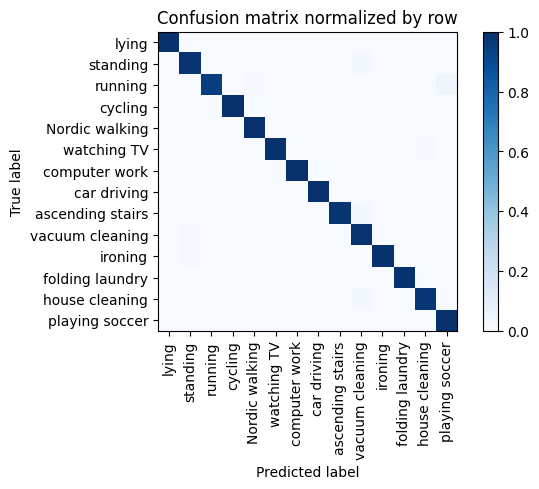

Training Epoch:  93%|█████████▎| 14/15 [16:16<01:10, 70.74s/it]

Overall accuracy: 0.988

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.998      0.999      0.148        614|	 vacuum cleaning: 0.002,	playing soccer: 0.000,	
         ironing       0.998      0.989      0.994      0.114        476|	 standing: 0.008,	vacuum cleaning: 0.002,	
        standing       0.981      0.981      0.981      0.090        373|	 vacuum cleaning: 0.016,	folding laundry: 0.003,	
  Nordic walking       0.995      1.000      0.997      0.088        367|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       1.000      0.992      0.996      0.086        356|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
  house cleaning       0.988      0.974      0.981      0.083        345|	 vacuum cleaning: 0.023,	folding laundry: 0.003,	
 vacuum cleaning       0.941      0.988      0.964      0.081        338|	 standing: 0.009,	ascending stairs: 0.003,	
         cycling       1.000    


train: 100%|██████████| 262/262 [00:58<00:00,  4.49batch/s, loss=258, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.64batch/s, loss=288]


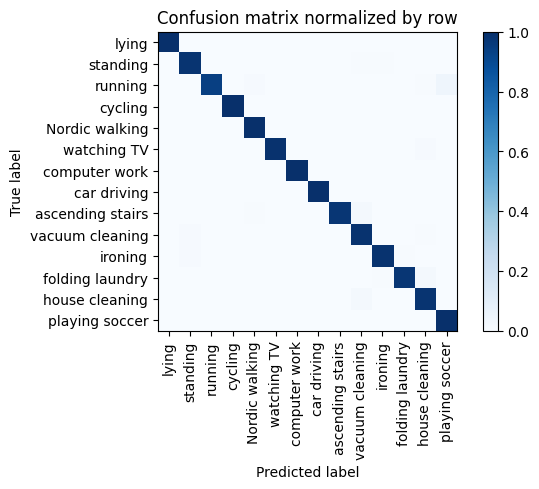

Overall accuracy: 0.988

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      1.000      1.000      0.147        613|	 playing soccer: 0.000,	house cleaning: 0.000,	
         ironing       0.992      0.987      0.989      0.114        475|	 standing: 0.008,	folding laundry: 0.004,	
        standing       0.981      0.984      0.983      0.090        373|	 ironing: 0.005,	vacuum cleaning: 0.005,	
  Nordic walking       0.992      1.000      0.996      0.087        364|	 playing soccer: 0.000,	house cleaning: 0.000,	
           lying       1.000      0.997      0.999      0.084        351|	 ironing: 0.003,	playing soccer: 0.000,	
  house cleaning       0.974      0.983      0.979      0.084        348|	 vacuum cleaning: 0.017,	playing soccer: 0.000,	
 vacuum cleaning       0.966      0.985      0.975      0.082        342|	 standing: 0.009,	house cleaning: 0.006,	
         cycling       1.000      0.997      0.998  

unseen: 100%|██████████| 86/86 [00:07<00:00, 10.76batch/s, loss=339]


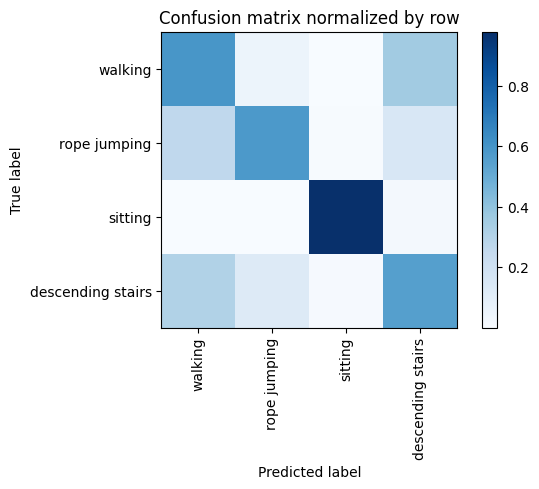

Overall accuracy: 0.709

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.768      0.589      0.667      0.422       2320|	 descending stairs: 0.354,	rope jumping: 0.052,	
          sitting       0.987      0.979      0.983      0.324       1785|	 descending stairs: 0.018,	rope jumping: 0.002,	
descending stairs       0.361      0.555      0.438      0.171        941|	 walking: 0.307,	rope jumping: 0.129,	
     rope jumping       0.519      0.579      0.547      0.083        458|	 walking: 0.264,	descending stairs: 0.151,	

----------------------------------------------------------------------------------------------------
      avg / total       0.749      0.709      0.720        1.0       5504|	      

{'accuracy': 0.7087572674418605, 'precision': 0.6588754278245208, 'recall': 0.675316813575475, 'f1': 0.6586311228961358}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum c

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17]
unseen classes >  [16, 0, 12, 8]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 242/242 [00:57<00:00,  4.22batch/s, loss=306, accuracy=0.781]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:05<00:00, 10.28batch/s, loss=316]


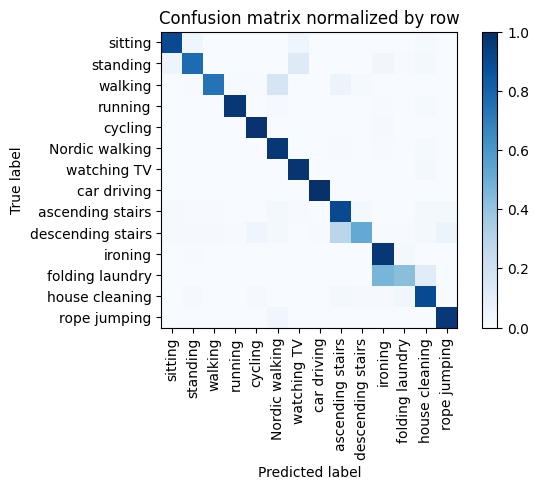

Training Epoch:   7%|▋         | 1/15 [01:04<14:56, 64.00s/it]

Overall accuracy: 0.859

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.740      0.848      0.124        477|	 Nordic walking: 0.170,	ascending stairs: 0.057,	
          ironing       0.806      0.973      0.881      0.123        473|	 folding laundry: 0.019,	standing: 0.006,	
   Nordic walking       0.800      0.972      0.878      0.103        396|	 house cleaning: 0.013,	ironing: 0.008,	
         standing       0.924      0.768      0.839      0.099        380|	 watching TV: 0.124,	sitting: 0.050,	
   house cleaning       0.859      0.895      0.877      0.094        361|	 folding laundry: 0.039,	ascending stairs: 0.019,	
          sitting       0.925      0.899      0.912      0.083        317|	 watching TV: 0.044,	standing: 0.041,	
          cycling       0.957      0.987      0.972      0.082        313|	 ironing: 0.010,	Nordic walking: 0.003,	
 ascending stairs       0.686      0.900      0.779   


train: 100%|██████████| 242/242 [00:56<00:00,  4.32batch/s, loss=288, accuracy=0.891]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.93batch/s, loss=309]


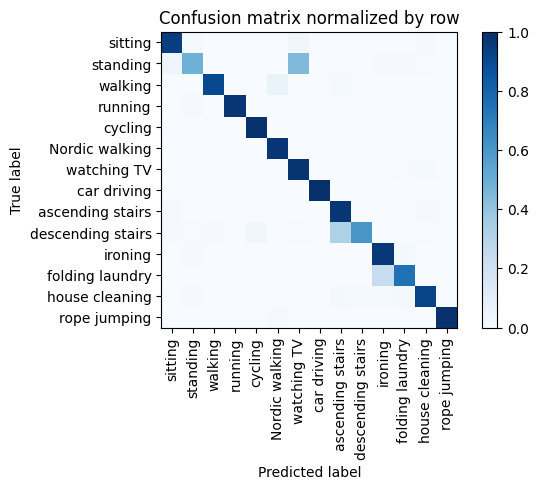

Training Epoch:  13%|█▎        | 2/15 [02:06<13:43, 63.34s/it]

Overall accuracy: 0.884

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.995      0.906      0.949      0.124        478|	 Nordic walking: 0.065,	ascending stairs: 0.013,	
          ironing       0.895      0.968      0.930      0.123        474|	 folding laundry: 0.019,	standing: 0.008,	
   Nordic walking       0.920      0.975      0.947      0.104        400|	 house cleaning: 0.007,	rope jumping: 0.005,	
         standing       0.915      0.491      0.639      0.098        375|	 watching TV: 0.448,	sitting: 0.040,	
   house cleaning       0.946      0.925      0.936      0.094        362|	 folding laundry: 0.017,	ascending stairs: 0.017,	
          cycling       0.972      0.990      0.981      0.082        314|	 house cleaning: 0.006,	standing: 0.003,	
          sitting       0.939      0.945      0.942      0.081        311|	 watching TV: 0.032,	standing: 0.013,	
 ascending stairs       0.751      0.973      0.


train: 100%|██████████| 242/242 [01:00<00:00,  4.02batch/s, loss=299, accuracy=0.891]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.30batch/s, loss=303]


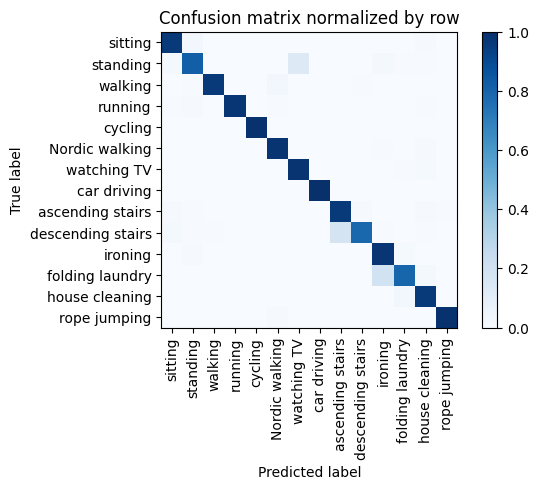

Training Epoch:  20%|██        | 3/15 [03:15<13:07, 65.63s/it]

Overall accuracy: 0.940

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.910      0.975      0.941      0.124        475|	 folding laundry: 0.015,	standing: 0.008,	
          walking       0.998      0.958      0.977      0.124        475|	 Nordic walking: 0.027,	descending stairs: 0.006,	
   Nordic walking       0.963      0.980      0.971      0.104        399|	 house cleaning: 0.010,	ironing: 0.005,	
         standing       0.939      0.820      0.876      0.098        378|	 watching TV: 0.132,	ironing: 0.019,	
   house cleaning       0.943      0.964      0.954      0.095        363|	 folding laundry: 0.028,	ironing: 0.003,	
          cycling       1.000      0.991      0.995      0.082        316|	 rope jumping: 0.003,	house cleaning: 0.003,	
          sitting       0.956      0.962      0.959      0.082        313|	 standing: 0.026,	house cleaning: 0.010,	
 ascending stairs       0.864      0.964      0.911   


train: 100%|██████████| 242/242 [00:59<00:00,  4.08batch/s, loss=306, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.85batch/s, loss=314]


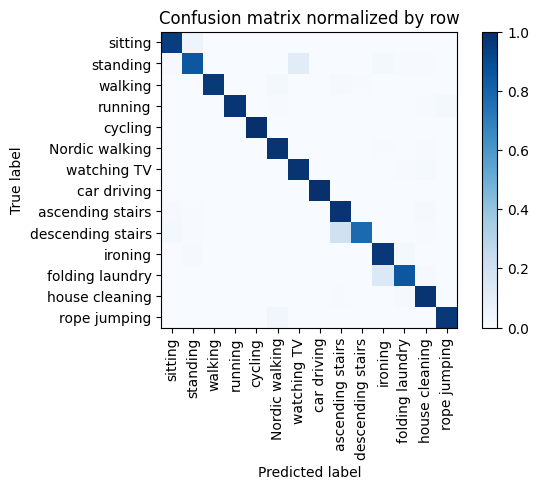

Training Epoch:  27%|██▋       | 4/15 [04:22<12:09, 66.31s/it]

Overall accuracy: 0.945

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.958      0.979      0.125        480|	 Nordic walking: 0.023,	ascending stairs: 0.008,	
          ironing       0.927      0.966      0.946      0.123        472|	 folding laundry: 0.023,	standing: 0.008,	
   Nordic walking       0.963      0.982      0.973      0.103        396|	 house cleaning: 0.008,	ironing: 0.008,	
         standing       0.931      0.850      0.888      0.099        379|	 watching TV: 0.111,	ironing: 0.016,	
   house cleaning       0.962      0.978      0.970      0.094        360|	 folding laundry: 0.011,	ascending stairs: 0.006,	
          sitting       0.968      0.949      0.958      0.082        315|	 standing: 0.048,	watching TV: 0.003,	
          cycling       1.000      0.994      0.997      0.081        311|	 ascending stairs: 0.003,	standing: 0.003,	
 ascending stairs       0.835      0.978      0.901


train: 100%|██████████| 242/242 [01:00<00:00,  3.98batch/s, loss=329, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.20batch/s, loss=297]


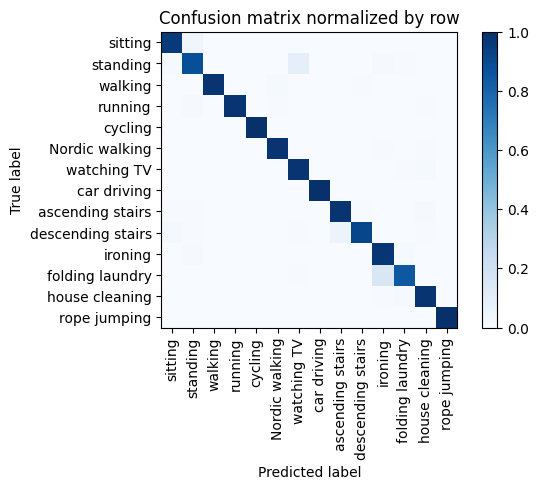

Training Epoch:  33%|███▎      | 5/15 [05:30<11:09, 66.98s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.979      0.989      0.125        479|	 Nordic walking: 0.013,	descending stairs: 0.006,	
          ironing       0.930      0.975      0.952      0.123        474|	 folding laundry: 0.015,	standing: 0.008,	
   Nordic walking       0.982      0.982      0.982      0.103        397|	 house cleaning: 0.008,	ironing: 0.005,	
         standing       0.933      0.879      0.905      0.099        380|	 watching TV: 0.092,	sitting: 0.013,	
   house cleaning       0.970      0.981      0.975      0.094        361|	 folding laundry: 0.011,	ironing: 0.006,	
          cycling       0.997      1.000      0.998      0.082        315|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.971      0.958      0.965      0.081        312|	 standing: 0.042,	rope jumping: 0.000,	
 ascending stairs       0.956      0.977      0.966     


train: 100%|██████████| 242/242 [01:00<00:00,  3.97batch/s, loss=287, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.56batch/s, loss=301]


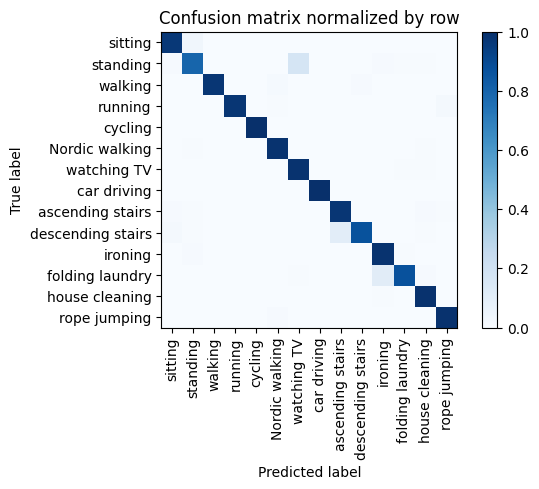

Training Epoch:  40%|████      | 6/15 [06:39<10:08, 67.58s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.946      0.985      0.965      0.124        476|	 standing: 0.008,	folding laundry: 0.004,	
          walking       1.000      0.975      0.987      0.124        475|	 Nordic walking: 0.013,	descending stairs: 0.008,	
   Nordic walking       0.980      0.985      0.983      0.104        400|	 house cleaning: 0.007,	standing: 0.005,	
         standing       0.940      0.796      0.862      0.098        377|	 watching TV: 0.170,	ironing: 0.011,	
   house cleaning       0.968      0.992      0.980      0.095        363|	 ironing: 0.006,	folding laundry: 0.003,	
          sitting       0.971      0.968      0.970      0.082        314|	 standing: 0.032,	rope jumping: 0.000,	
          cycling       1.000      0.997      0.998      0.082        313|	 rope jumping: 0.003,	house cleaning: 0.000,	
 ascending stairs       0.915      0.973      0.943    


train: 100%|██████████| 242/242 [00:57<00:00,  4.24batch/s, loss=289, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.22batch/s, loss=300]


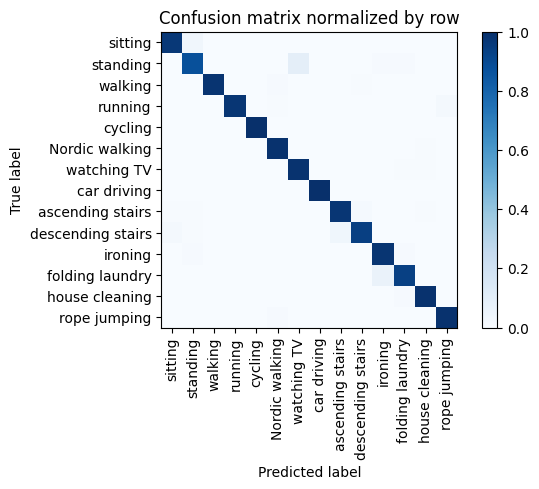

Training Epoch:  47%|████▋     | 7/15 [07:44<08:52, 66.60s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.969      0.979      0.974      0.124        476|	 folding laundry: 0.011,	standing: 0.008,	
          walking       1.000      0.983      0.991      0.122        470|	 Nordic walking: 0.009,	descending stairs: 0.004,	
   Nordic walking       0.985      0.990      0.987      0.103        397|	 house cleaning: 0.008,	ascending stairs: 0.003,	
         standing       0.951      0.879      0.914      0.099        379|	 watching TV: 0.098,	folding laundry: 0.011,	
   house cleaning       0.984      0.989      0.986      0.095        365|	 folding laundry: 0.008,	descending stairs: 0.003,	
          cycling       1.000      1.000      1.000      0.082        315|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.984      0.968      0.976      0.082        314|	 standing: 0.032,	rope jumping: 0.000,	
 ascending stairs       0.965


train: 100%|██████████| 242/242 [01:06<00:00,  3.62batch/s, loss=270, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.61batch/s, loss=295]


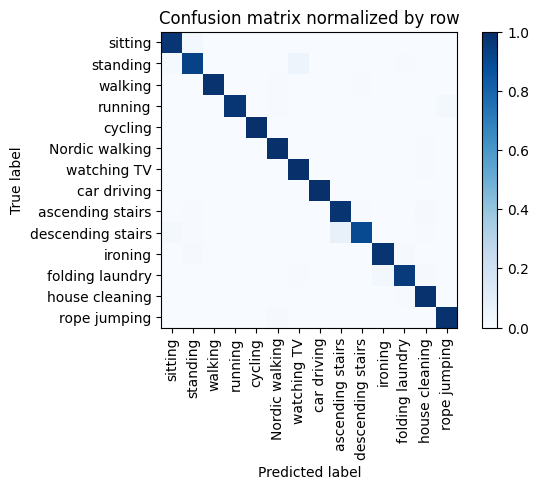

Training Epoch:  53%|█████▎    | 8/15 [08:58<08:03, 69.14s/it]

Overall accuracy: 0.974

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.987      0.977      0.982      0.123        473|	 folding laundry: 0.011,	standing: 0.008,	
          walking       1.000      0.985      0.993      0.123        472|	 Nordic walking: 0.006,	descending stairs: 0.004,	
   Nordic walking       0.988      0.992      0.990      0.104        398|	 house cleaning: 0.008,	rope jumping: 0.000,	
         standing       0.956      0.928      0.942      0.098        376|	 watching TV: 0.051,	sitting: 0.013,	
   house cleaning       0.973      0.989      0.981      0.095        363|	 folding laundry: 0.006,	descending stairs: 0.003,	
          cycling       1.000      0.997      0.998      0.082        316|	 ascending stairs: 0.003,	rope jumping: 0.000,	
          sitting       0.975      0.975      0.975      0.082        316|	 standing: 0.025,	rope jumping: 0.000,	
 ascending stairs       0.932      0.98


train: 100%|██████████| 242/242 [00:57<00:00,  4.17batch/s, loss=273, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.66batch/s, loss=269]


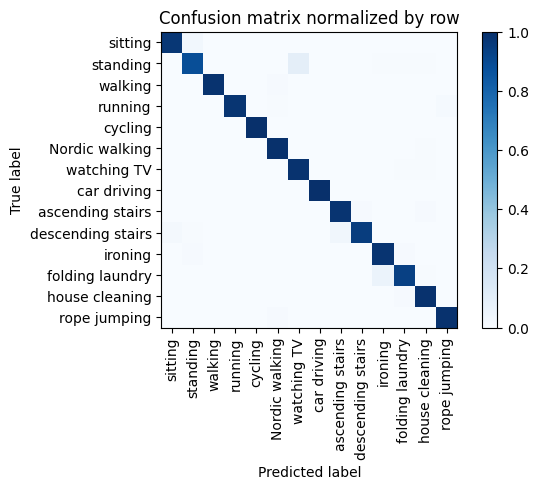

Training Epoch:  60%|██████    | 9/15 [10:03<06:47, 67.85s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.985      0.993      0.124        477|	 Nordic walking: 0.010,	descending stairs: 0.002,	
          ironing       0.971      0.981      0.976      0.123        474|	 folding laundry: 0.008,	standing: 0.008,	
   Nordic walking       0.983      0.995      0.989      0.105        402|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.957      0.886      0.920      0.098        376|	 watching TV: 0.096,	house cleaning: 0.005,	
   house cleaning       0.975      0.989      0.982      0.094        361|	 folding laundry: 0.008,	ironing: 0.003,	
          cycling       1.000      1.000      1.000      0.082        315|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.987      0.971      0.979      0.082        315|	 standing: 0.029,	rope jumping: 0.000,	
 ascending stairs       0.973      0.982    


train: 100%|██████████| 242/242 [00:57<00:00,  4.19batch/s, loss=281, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.65batch/s, loss=299]


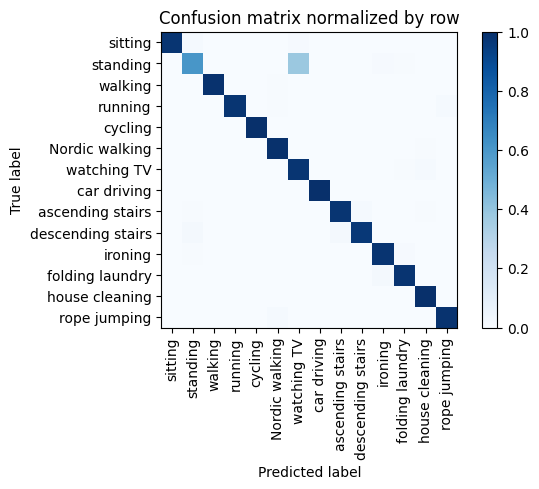

Training Epoch:  67%|██████▋   | 10/15 [11:08<05:34, 66.98s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.985      0.983      0.984      0.124        478|	 folding laundry: 0.008,	standing: 0.006,	
          walking       1.000      0.989      0.995      0.123        472|	 Nordic walking: 0.006,	descending stairs: 0.002,	
   Nordic walking       0.988      0.995      0.991      0.103        397|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.950      0.602      0.737      0.098        377|	 watching TV: 0.379,	ironing: 0.011,	
   house cleaning       0.986      0.997      0.992      0.095        364|	 folding laundry: 0.003,	rope jumping: 0.000,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.997      0.978      0.987      0.082        314|	 standing: 0.013,	watching TV: 0.010,	
 ascending stairs       0.987      0.978      0


train: 100%|██████████| 242/242 [01:08<00:00,  3.55batch/s, loss=280, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.46batch/s, loss=282]


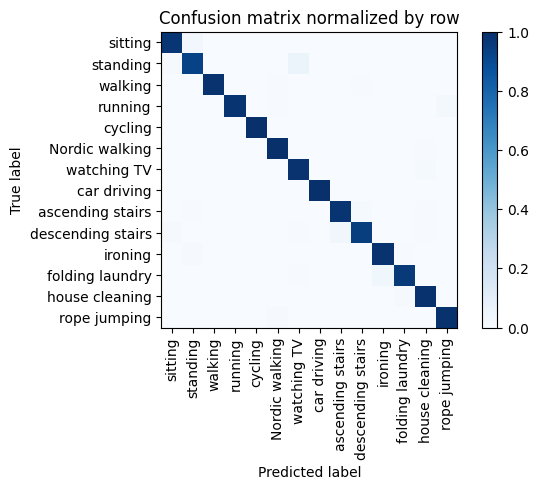

Training Epoch:  73%|███████▎  | 11/15 [12:25<04:39, 69.83s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.981      0.987      0.984      0.124        477|	 standing: 0.008,	folding laundry: 0.004,	
          walking       1.000      0.987      0.994      0.124        476|	 Nordic walking: 0.006,	descending stairs: 0.004,	
   Nordic walking       0.987      0.992      0.990      0.103        395|	 house cleaning: 0.005,	ascending stairs: 0.003,	
         standing       0.961      0.927      0.944      0.097        371|	 watching TV: 0.059,	sitting: 0.008,	
   house cleaning       0.984      0.989      0.986      0.095        364|	 folding laundry: 0.008,	ironing: 0.003,	
          sitting       0.984      0.975      0.979      0.082        315|	 standing: 0.025,	rope jumping: 0.000,	
          cycling       1.000      1.000      1.000      0.082        313|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.969      0.978      0


train: 100%|██████████| 242/242 [00:58<00:00,  4.16batch/s, loss=289, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.87batch/s, loss=283]


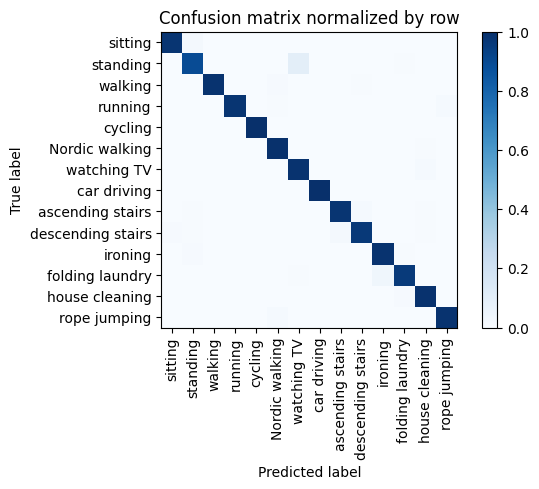

Training Epoch:  80%|████████  | 12/15 [13:30<03:25, 68.41s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.981      0.987      0.984      0.124        476|	 standing: 0.008,	folding laundry: 0.004,	
          walking       1.000      0.985      0.993      0.123        474|	 Nordic walking: 0.008,	descending stairs: 0.004,	
   Nordic walking       0.985      0.995      0.990      0.103        394|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.960      0.894      0.926      0.098        378|	 watching TV: 0.098,	folding laundry: 0.005,	
   house cleaning       0.983      0.989      0.986      0.094        361|	 folding laundry: 0.008,	ironing: 0.003,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.994      0.978      0.986      0.082        316|	 standing: 0.022,	rope jumping: 0.000,	
 ascending stairs       0.986      0.978   


train: 100%|██████████| 242/242 [00:57<00:00,  4.18batch/s, loss=270, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.93batch/s, loss=279]


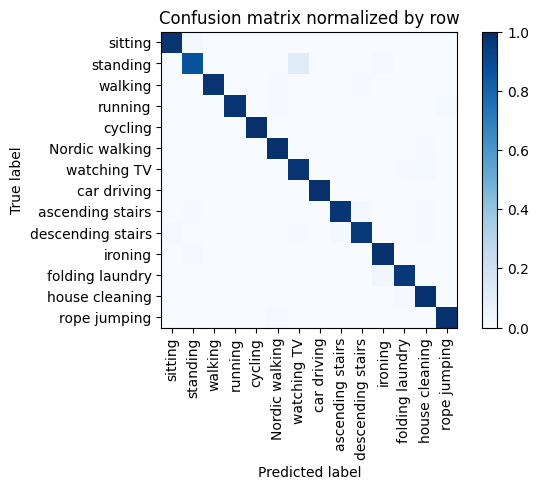

Training Epoch:  87%|████████▋ | 13/15 [14:34<02:14, 67.32s/it]

Overall accuracy: 0.974

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.979      0.992      0.985      0.124        476|	 standing: 0.008,	rope jumping: 0.000,	
          walking       1.000      0.983      0.992      0.124        475|	 Nordic walking: 0.006,	descending stairs: 0.004,	
   Nordic walking       0.988      0.995      0.991      0.104        398|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.965      0.868      0.914      0.099        379|	 watching TV: 0.119,	ironing: 0.008,	
   house cleaning       0.984      0.989      0.986      0.094        362|	 folding laundry: 0.008,	ironing: 0.003,	
          cycling       1.000      1.000      1.000      0.082        313|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.990      0.981      0.985      0.081        310|	 standing: 0.019,	rope jumping: 0.000,	
 ascending stairs       0.982      0.973      0.978   


train: 100%|██████████| 242/242 [01:06<00:00,  3.63batch/s, loss=281, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:05<00:00, 11.86batch/s, loss=274]


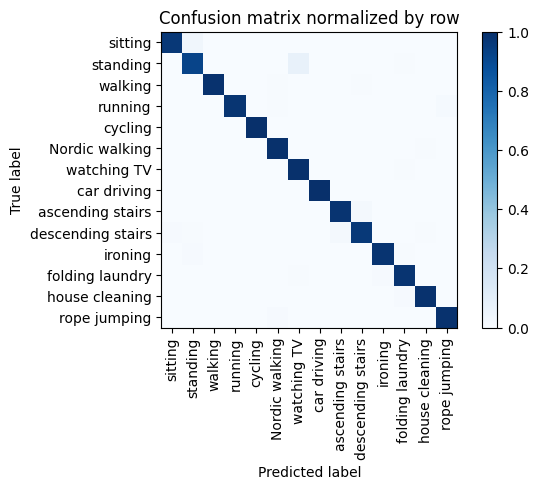

Training Epoch:  93%|█████████▎| 14/15 [15:47<01:08, 68.90s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.989      0.995      0.123        474|	 descending stairs: 0.004,	Nordic walking: 0.004,	
          ironing       0.994      0.983      0.988      0.122        469|	 standing: 0.009,	folding laundry: 0.004,	
   Nordic walking       0.990      0.995      0.992      0.104        398|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.959      0.918      0.938      0.099        380|	 watching TV: 0.071,	folding laundry: 0.005,	
   house cleaning       0.989      0.992      0.990      0.095        364|	 folding laundry: 0.008,	rope jumping: 0.000,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.990      0.968      0.979      0.082        315|	 standing: 0.032,	rope jumping: 0.000,	
 ascending stairs       0.987      0.9


train: 100%|██████████| 242/242 [00:52<00:00,  4.63batch/s, loss=260, accuracy=1]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:05<00:00, 10.34batch/s, loss=288]


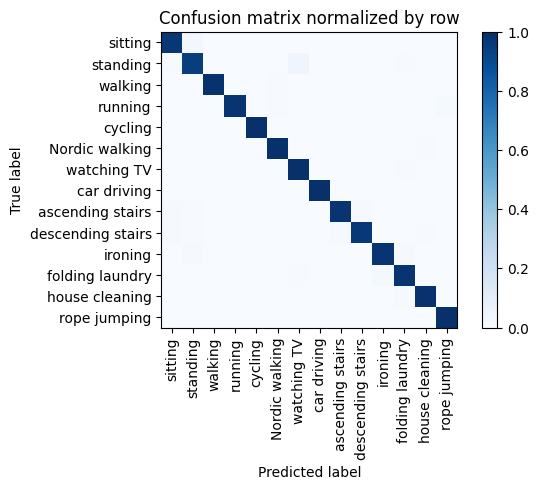

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.992      0.996      0.124        475|	 Nordic walking: 0.004,	descending stairs: 0.002,	
          ironing       0.991      0.983      0.987      0.122        469|	 folding laundry: 0.009,	standing: 0.009,	
   Nordic walking       0.992      0.995      0.994      0.104        398|	 house cleaning: 0.005,	rope jumping: 0.000,	
         standing       0.960      0.947      0.953      0.098        377|	 watching TV: 0.040,	folding laundry: 0.005,	
   house cleaning       0.992      0.992      0.992      0.095        365|	 folding laundry: 0.008,	rope jumping: 0.000,	
          cycling       1.000      1.000      1.000      0.082        315|	 rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.981      0.971      0.976      0.082        315|	 standing: 0.029,	rope jumping: 0.000,	
 ascending stairs       0.991      0.9

unseen: 100%|██████████| 111/111 [00:10<00:00, 10.93batch/s, loss=295]


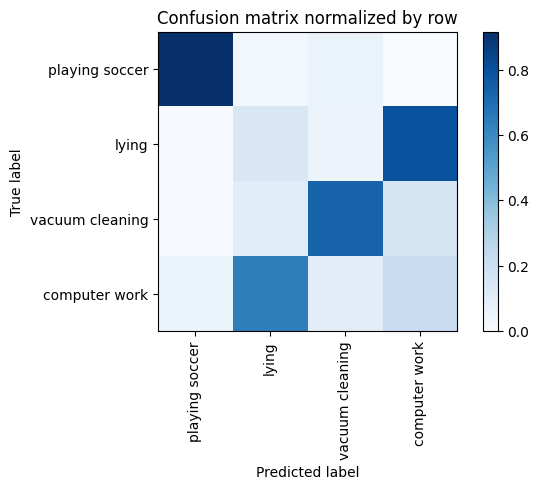

Overall accuracy: 0.362

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.268      0.211      0.236      0.432       3071|	 lying: 0.640,	vacuum cleaning: 0.096,	
          lying       0.108      0.139      0.121      0.264       1875|	 computer work: 0.802,	vacuum cleaning: 0.053,	
vacuum cleaning       0.747      0.731      0.739      0.239       1701|	 computer work: 0.153,	lying: 0.106,	
 playing soccer       0.687      0.917      0.785      0.064        457|	 vacuum cleaning: 0.059,	lying: 0.024,	

----------------------------------------------------------------------------------------------------
    avg / total       0.367      0.362      0.361        1.0       7104|	      

{'accuracy': 0.361768018018018, 'precision': 0.45236048553322444, 'recall': 0.4993826877935977, 'f1': 0.470375592406845}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per class count :  {'ly

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
unseen classes >  [5, 4, 6]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 276/276 [01:01<00:00,  4.46batch/s, loss=305, accuracy=0.812]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.82batch/s, loss=325]


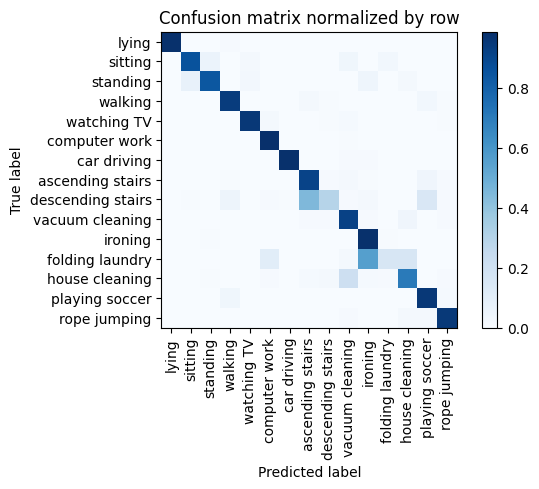

Training Epoch:   7%|▋         | 1/15 [01:09<16:19, 69.95s/it]

Overall accuracy: 0.857

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.955      0.986      0.970      0.146        645|	 vacuum cleaning: 0.005,	house cleaning: 0.003,	
          walking       0.963      0.937      0.950      0.108        475|	 playing soccer: 0.029,	ascending stairs: 0.019,	
          ironing       0.763      0.980      0.858      0.103        457|	 folding laundry: 0.007,	standing: 0.007,	
   house cleaning       0.822      0.703      0.758      0.083        367|	 vacuum cleaning: 0.210,	descending stairs: 0.022,	
         standing       0.911      0.837      0.872      0.083        367|	 sitting: 0.071,	ironing: 0.044,	
          sitting       0.918      0.855      0.885      0.083        366|	 standing: 0.060,	vacuum cleaning: 0.038,	
            lying       1.000      0.981      0.990      0.082        361|	 walking: 0.008,	rope jumping: 0.003,	
  vacuum cleaning       0.745      0.920      0


train: 100%|██████████| 276/276 [01:04<00:00,  4.26batch/s, loss=303, accuracy=0.859]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.73batch/s, loss=296]


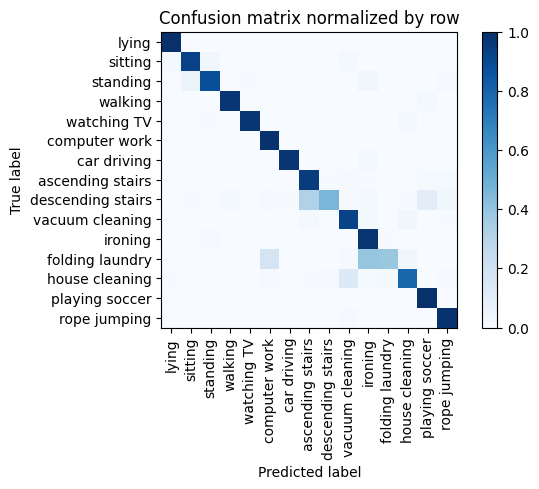

Training Epoch:  13%|█▎        | 2/15 [02:22<15:30, 71.56s/it]

Overall accuracy: 0.902

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.941      0.989      0.965      0.147        648|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
          walking       0.989      0.975      0.982      0.107        474|	 playing soccer: 0.017,	rope jumping: 0.002,	
          ironing       0.806      0.982      0.886      0.103        457|	 standing: 0.009,	folding laundry: 0.004,	
          sitting       0.927      0.932      0.930      0.084        369|	 standing: 0.033,	vacuum cleaning: 0.019,	
   house cleaning       0.927      0.791      0.853      0.083        368|	 vacuum cleaning: 0.136,	folding laundry: 0.016,	
         standing       0.942      0.880      0.910      0.083        367|	 sitting: 0.063,	ironing: 0.038,	
            lying       0.978      0.994      0.986      0.082        362|	 ascending stairs: 0.003,	standing: 0.003,	
  vacuum cleaning       0.825      0.925      0.


train: 100%|██████████| 276/276 [01:09<00:00,  3.99batch/s, loss=298, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.35batch/s, loss=292]


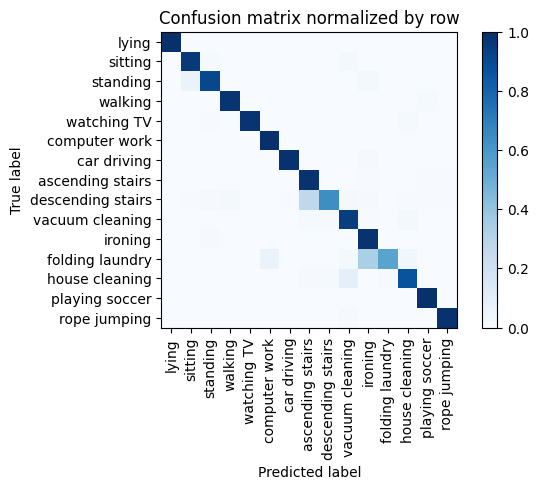

Training Epoch:  20%|██        | 3/15 [03:40<14:50, 74.21s/it]

Overall accuracy: 0.933

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.992      0.986      0.147        648|	 house cleaning: 0.003,	playing soccer: 0.002,	
          walking       0.989      0.979      0.984      0.108        475|	 playing soccer: 0.013,	rope jumping: 0.002,	
          ironing       0.851      0.987      0.914      0.103        457|	 standing: 0.009,	folding laundry: 0.002,	
          sitting       0.930      0.965      0.947      0.084        369|	 vacuum cleaning: 0.019,	standing: 0.014,	
         standing       0.960      0.910      0.934      0.083        367|	 sitting: 0.065,	ironing: 0.022,	
   house cleaning       0.943      0.865      0.903      0.082        364|	 vacuum cleaning: 0.091,	descending stairs: 0.014,	
            lying       0.997      0.997      0.997      0.082        360|	 ascending stairs: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.868      0.945   


train: 100%|██████████| 276/276 [01:10<00:00,  3.89batch/s, loss=322, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.56batch/s, loss=274]


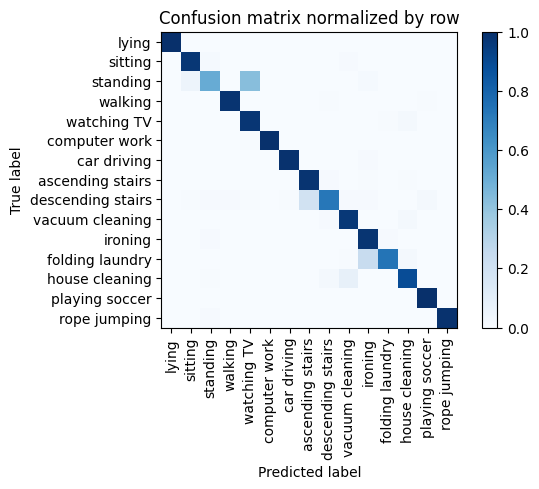

Training Epoch:  27%|██▋       | 4/15 [04:59<13:57, 76.11s/it]

Overall accuracy: 0.915

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.995      0.998      0.146        646|	 watching TV: 0.005,	rope jumping: 0.000,	
          walking       0.994      0.983      0.988      0.107        474|	 playing soccer: 0.006,	descending stairs: 0.006,	
          ironing       0.889      0.978      0.931      0.103        457|	 folding laundry: 0.011,	standing: 0.009,	
          sitting       0.945      0.970      0.957      0.084        369|	 standing: 0.014,	vacuum cleaning: 0.011,	
   house cleaning       0.956      0.888      0.921      0.083        367|	 vacuum cleaning: 0.079,	descending stairs: 0.019,	
         standing       0.930      0.508      0.657      0.082        364|	 watching TV: 0.429,	sitting: 0.049,	
            lying       0.997      1.000      0.999      0.082        362|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.903      0.965 


train: 100%|██████████| 276/276 [01:09<00:00,  3.97batch/s, loss=278, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.77batch/s, loss=292]


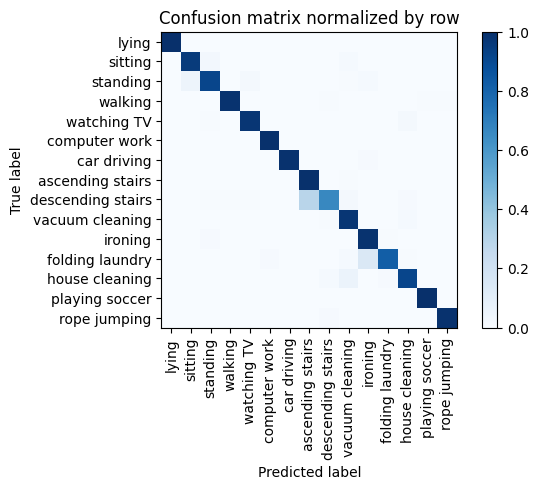

Training Epoch:  33%|███▎      | 5/15 [06:17<12:48, 76.89s/it]

Overall accuracy: 0.953

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.994      0.995      0.147        647|	 watching TV: 0.003,	house cleaning: 0.002,	
          walking       0.996      0.987      0.992      0.108        475|	 rope jumping: 0.004,	playing soccer: 0.004,	
          ironing       0.929      0.985      0.956      0.103        454|	 standing: 0.009,	folding laundry: 0.007,	
          sitting       0.949      0.957      0.953      0.084        369|	 standing: 0.027,	vacuum cleaning: 0.014,	
   house cleaning       0.966      0.916      0.940      0.083        367|	 vacuum cleaning: 0.060,	descending stairs: 0.014,	
         standing       0.952      0.916      0.933      0.083        367|	 sitting: 0.049,	watching TV: 0.016,	
            lying       1.000      0.997      0.999      0.082        362|	 watching TV: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.901      0.974      0


train: 100%|██████████| 276/276 [01:06<00:00,  4.14batch/s, loss=307, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.80batch/s, loss=272]


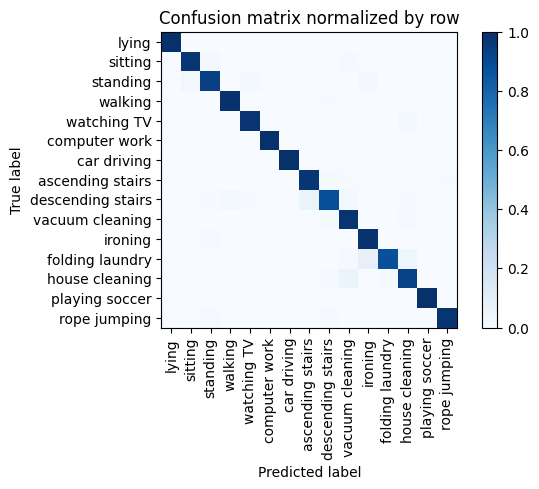

Training Epoch:  40%|████      | 6/15 [07:31<11:24, 76.10s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.995      0.998      0.147        647|	 house cleaning: 0.002,	watching TV: 0.002,	
          walking       0.992      0.992      0.992      0.107        473|	 descending stairs: 0.004,	playing soccer: 0.002,	
          ironing       0.956      0.987      0.971      0.104        458|	 standing: 0.011,	folding laundry: 0.002,	
          sitting       0.973      0.973      0.973      0.083        368|	 standing: 0.016,	vacuum cleaning: 0.011,	
         standing       0.955      0.935      0.945      0.083        367|	 sitting: 0.027,	watching TV: 0.019,	
   house cleaning       0.958      0.926      0.942      0.083        366|	 vacuum cleaning: 0.052,	folding laundry: 0.008,	
            lying       1.000      0.997      0.999      0.082        362|	 standing: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.914      0.977      0


train: 100%|██████████| 276/276 [01:18<00:00,  3.52batch/s, loss=273, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.98batch/s, loss=286]


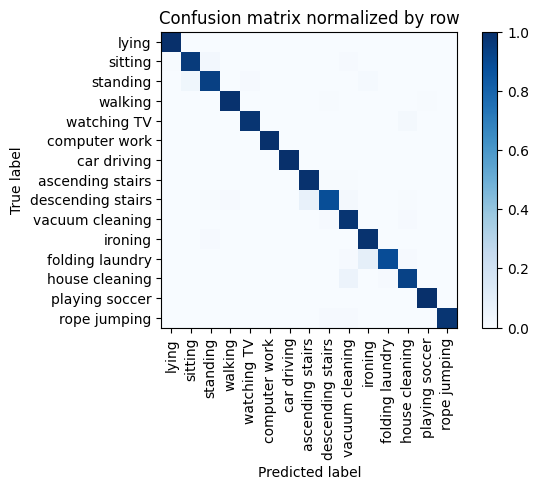

Training Epoch:  47%|████▋     | 7/15 [08:58<10:37, 79.67s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.995      0.998      0.146        646|	 house cleaning: 0.002,	watching TV: 0.002,	
          walking       0.994      0.989      0.992      0.108        476|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.954      0.987      0.970      0.104        458|	 standing: 0.011,	folding laundry: 0.002,	
          sitting       0.959      0.957      0.958      0.084        370|	 standing: 0.027,	vacuum cleaning: 0.011,	
         standing       0.950      0.935      0.942      0.083        367|	 sitting: 0.038,	ironing: 0.014,	
   house cleaning       0.968      0.926      0.947      0.083        365|	 vacuum cleaning: 0.058,	folding laundry: 0.008,	
            lying       0.992      1.000      0.996      0.082        361|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.909      0.977     


train: 100%|██████████| 276/276 [01:13<00:00,  3.78batch/s, loss=309, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.68batch/s, loss=295]


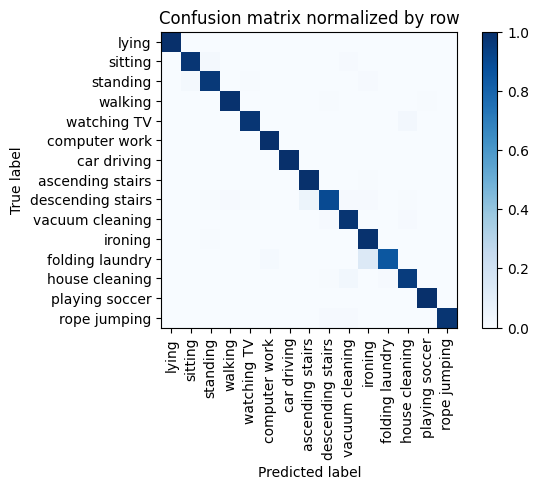

Training Epoch:  53%|█████▎    | 8/15 [10:20<09:22, 80.35s/it]

Overall accuracy: 0.974

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      1.000      0.998      0.147        647|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.994      0.989      0.992      0.108        475|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.932      0.991      0.961      0.103        457|	 standing: 0.007,	watching TV: 0.002,	
         standing       0.970      0.965      0.967      0.083        368|	 sitting: 0.019,	ironing: 0.008,	
          sitting       0.981      0.973      0.977      0.083        368|	 standing: 0.016,	vacuum cleaning: 0.011,	
   house cleaning       0.975      0.951      0.963      0.083        366|	 vacuum cleaning: 0.030,	folding laundry: 0.011,	
            lying       1.000      0.997      0.999      0.082        361|	 standing: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.947      0.977      0.961   


train: 100%|██████████| 276/276 [01:10<00:00,  3.91batch/s, loss=295, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.14batch/s, loss=288]


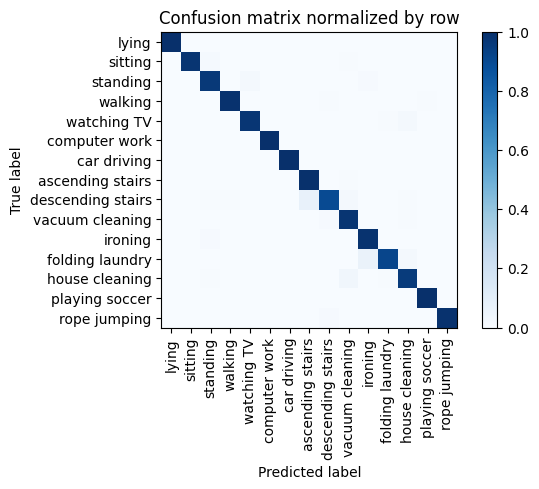

Training Epoch:  60%|██████    | 9/15 [11:38<07:57, 79.54s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.147        648|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.996      0.989      0.993      0.108        475|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.966      0.987      0.976      0.104        458|	 standing: 0.011,	folding laundry: 0.002,	
          sitting       0.997      0.978      0.988      0.084        369|	 standing: 0.014,	vacuum cleaning: 0.005,	
   house cleaning       0.972      0.954      0.963      0.083        366|	 vacuum cleaning: 0.033,	folding laundry: 0.005,	
         standing       0.964      0.964      0.964      0.083        366|	 watching TV: 0.019,	ironing: 0.011,	
            lying       0.997      1.000      0.999      0.082        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.947      0.980


train: 100%|██████████| 276/276 [00:56<00:00,  4.89batch/s, loss=264, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.26batch/s, loss=288]


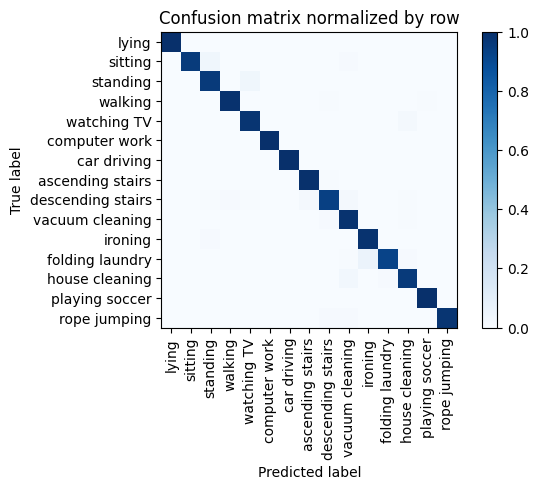

Training Epoch:  67%|██████▋   | 10/15 [12:41<06:12, 74.52s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.146        645|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.994      0.992      0.993      0.108        476|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.974      0.987      0.980      0.104        458|	 standing: 0.011,	watching TV: 0.002,	
          sitting       0.997      0.954      0.975      0.083        368|	 standing: 0.035,	vacuum cleaning: 0.008,	
         standing       0.949      0.959      0.954      0.083        366|	 watching TV: 0.036,	vacuum cleaning: 0.003,	
   house cleaning       0.978      0.959      0.968      0.082        364|	 vacuum cleaning: 0.027,	folding laundry: 0.008,	
            lying       0.994      1.000      0.997      0.082        361|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.948      0


train: 100%|██████████| 276/276 [00:55<00:00,  5.02batch/s, loss=270, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:05<00:00, 11.76batch/s, loss=270]


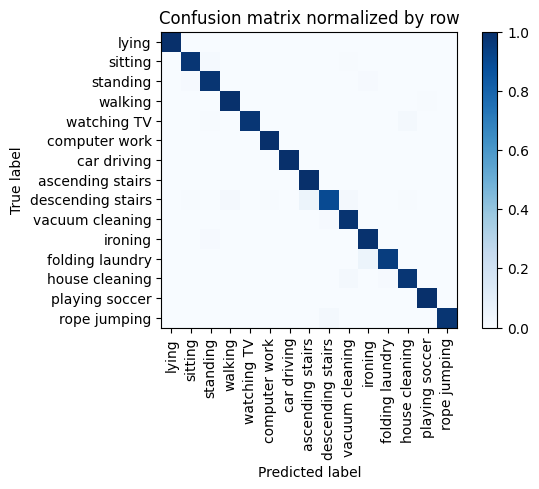

Training Epoch:  73%|███████▎  | 11/15 [13:43<04:42, 70.58s/it]

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      1.000      0.998      0.147        647|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.992      0.994      0.993      0.108        476|	 playing soccer: 0.004,	descending stairs: 0.002,	
          ironing       0.970      0.989      0.979      0.103        457|	 standing: 0.011,	rope jumping: 0.000,	
          sitting       0.989      0.976      0.982      0.084        369|	 standing: 0.014,	vacuum cleaning: 0.005,	
         standing       0.970      0.978      0.974      0.083        367|	 ironing: 0.011,	sitting: 0.008,	
   house cleaning       0.986      0.973      0.979      0.083        366|	 vacuum cleaning: 0.016,	folding laundry: 0.008,	
            lying       0.997      1.000      0.999      0.082        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.966      0.983      0


train: 100%|██████████| 276/276 [00:55<00:00,  5.01batch/s, loss=269, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:05<00:00, 11.77batch/s, loss=258]


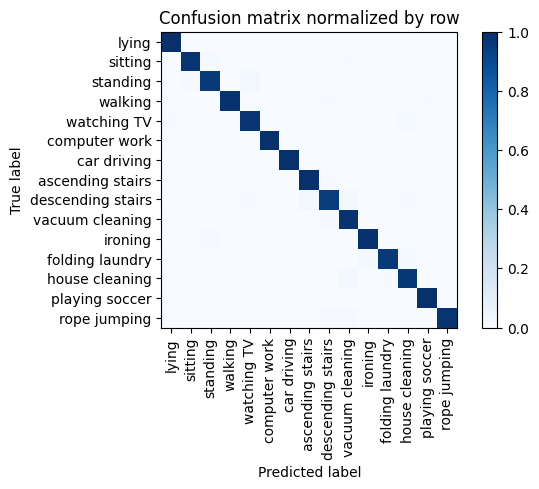

Training Epoch:  80%|████████  | 12/15 [14:45<03:23, 67.88s/it]

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.147        647|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       1.000      0.989      0.995      0.108        475|	 descending stairs: 0.006,	playing soccer: 0.004,	
          ironing       0.991      0.989      0.990      0.103        455|	 standing: 0.011,	rope jumping: 0.000,	
          sitting       0.989      0.981      0.985      0.084        370|	 standing: 0.014,	vacuum cleaning: 0.005,	
   house cleaning       0.981      0.967      0.974      0.083        368|	 vacuum cleaning: 0.022,	folding laundry: 0.005,	
         standing       0.972      0.959      0.966      0.083        366|	 watching TV: 0.027,	sitting: 0.011,	
            lying       0.994      1.000      0.997      0.082        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.958      0.986   


train: 100%|██████████| 276/276 [00:53<00:00,  5.14batch/s, loss=267, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.11batch/s, loss=270]


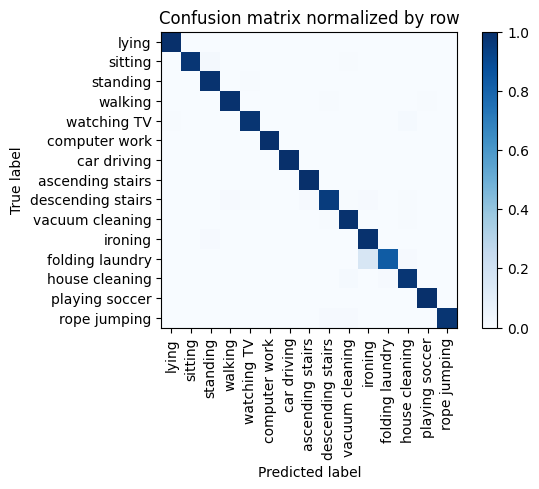

Training Epoch:  87%|████████▋ | 13/15 [15:45<02:11, 65.55s/it]

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.146        646|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.994      0.992      0.993      0.108        476|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.930      0.991      0.960      0.103        457|	 standing: 0.009,	rope jumping: 0.000,	
          sitting       0.997      0.973      0.985      0.083        368|	 standing: 0.022,	vacuum cleaning: 0.005,	
         standing       0.968      0.986      0.977      0.083        367|	 watching TV: 0.005,	ironing: 0.003,	
   house cleaning       0.981      0.975      0.978      0.083        366|	 vacuum cleaning: 0.014,	folding laundry: 0.008,	
            lying       0.997      1.000      0.999      0.081        358|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.972      0.988   


train: 100%|██████████| 276/276 [00:55<00:00,  5.01batch/s, loss=255, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.42batch/s, loss=281]


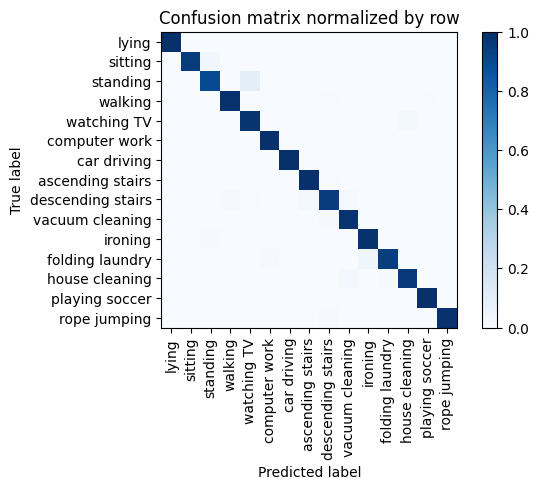

Training Epoch:  93%|█████████▎| 14/15 [16:46<01:04, 64.11s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      1.000      0.998      0.147        647|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.994      0.992      0.993      0.107        474|	 playing soccer: 0.004,	descending stairs: 0.004,	
          ironing       0.983      0.989      0.986      0.103        457|	 standing: 0.011,	rope jumping: 0.000,	
          sitting       1.000      0.957      0.978      0.084        369|	 standing: 0.035,	vacuum cleaning: 0.003,	
         standing       0.948      0.897      0.922      0.083        368|	 watching TV: 0.101,	vacuum cleaning: 0.003,	
   house cleaning       0.986      0.962      0.974      0.083        367|	 vacuum cleaning: 0.025,	folding laundry: 0.008,	
            lying       0.997      1.000      0.999      0.082        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.963      


train: 100%|██████████| 276/276 [00:47<00:00,  5.78batch/s, loss=287, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.91batch/s, loss=260]


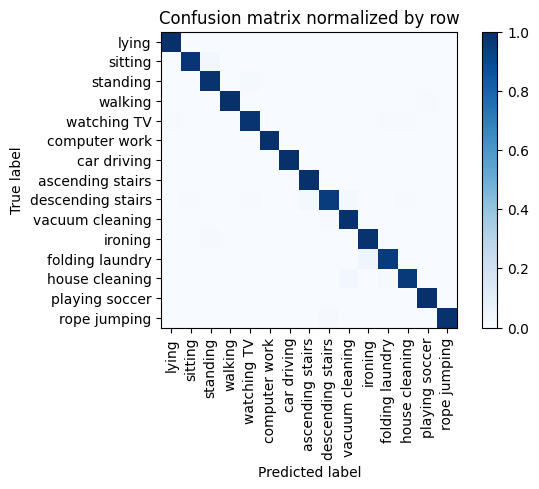

Overall accuracy: 0.986

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      1.000      1.000      0.146        646|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.998      0.994      0.996      0.108        476|	 playing soccer: 0.004,	descending stairs: 0.002,	
          ironing       0.980      0.987      0.984      0.103        457|	 standing: 0.011,	watching TV: 0.002,	
          sitting       0.997      0.973      0.985      0.084        370|	 standing: 0.027,	rope jumping: 0.000,	
   house cleaning       0.992      0.962      0.976      0.083        366|	 vacuum cleaning: 0.025,	folding laundry: 0.011,	
         standing       0.960      0.986      0.973      0.083        366|	 watching TV: 0.014,	rope jumping: 0.000,	
            lying       0.997      1.000      0.999      0.082        360|	 rope jumping: 0.000,	playing soccer: 0.000,	
  vacuum cleaning       0.966      0.991  

unseen: 100%|██████████| 68/68 [00:05<00:00, 13.55batch/s, loss=384]


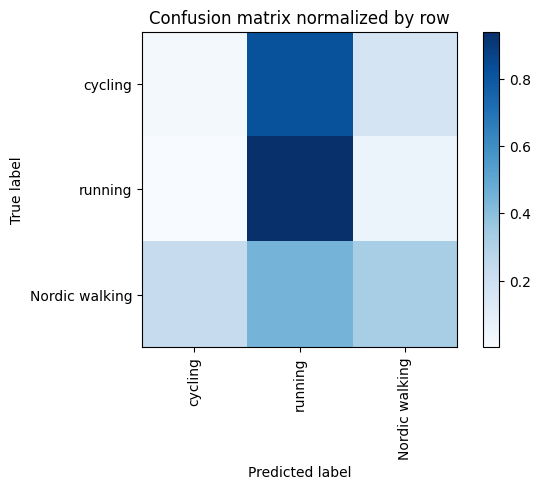

Overall accuracy: 0.345

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.648      0.325      0.433      0.419       1824|	 running: 0.446,	cycling: 0.230,	
       cycling       0.060      0.017      0.027      0.365       1589|	 running: 0.816,	Nordic walking: 0.167,	
       running       0.295      0.939      0.449      0.216        939|	 Nordic walking: 0.059,	cycling: 0.002,	

----------------------------------------------------------------------------------------------------
   avg / total       0.357      0.345      0.288        1.0       4352|	      

{'accuracy': 0.34489889705882354, 'precision': 0.33452144674648787, 'recall': 0.4269501156211148, 'f1': 0.3026516540695749}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, '

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 15, 16, 17]
unseen classes >  [13, 9, 14]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 283/283 [00:55<00:00,  5.08batch/s, loss=338, accuracy=0.859]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.19batch/s, loss=314]


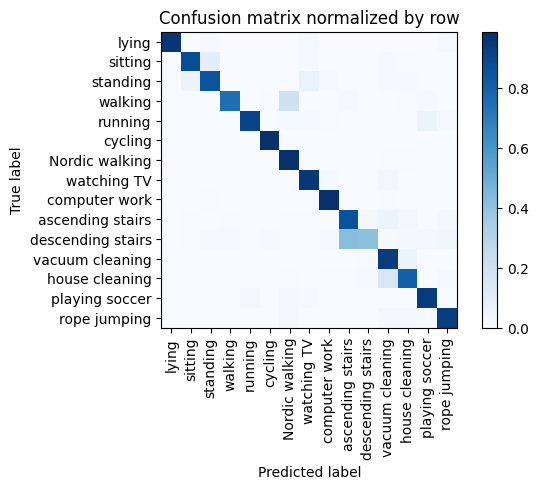

Training Epoch:   7%|▋         | 1/15 [01:02<14:37, 62.71s/it]

Overall accuracy: 0.884

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.983      0.981      0.135        605|	 vacuum cleaning: 0.005,	standing: 0.005,	
          walking       0.989      0.751      0.854      0.102        458|	 Nordic walking: 0.201,	playing soccer: 0.015,	
   Nordic walking       0.791      0.985      0.877      0.087        391|	 vacuum cleaning: 0.008,	house cleaning: 0.005,	
         standing       0.876      0.847      0.861      0.086        385|	 watching TV: 0.068,	sitting: 0.055,	
  vacuum cleaning       0.798      0.937      0.862      0.081        363|	 house cleaning: 0.052,	descending stairs: 0.006,	
            lying       1.000      0.961      0.980      0.081        363|	 watching TV: 0.014,	rope jumping: 0.008,	
          sitting       0.917      0.875      0.895      0.079        352|	 standing: 0.097,	vacuum cleaning: 0.014,	
   house cleaning       0.857      0.804  


train: 100%|██████████| 283/283 [00:56<00:00,  5.04batch/s, loss=289, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:06<00:00, 10.92batch/s, loss=289]


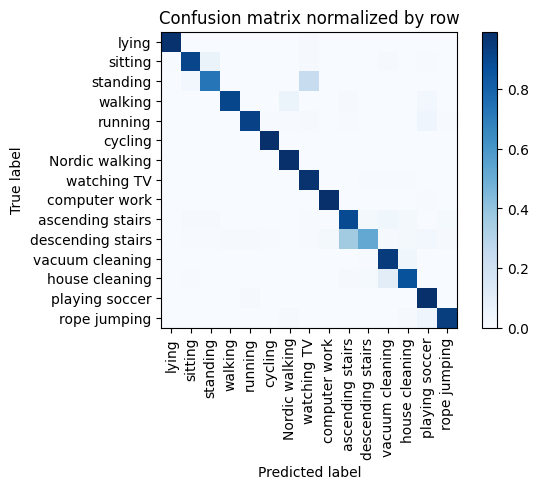

Training Epoch:  13%|█▎        | 2/15 [02:06<13:39, 63.06s/it]

Overall accuracy: 0.910

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.988      0.990      0.135        603|	 playing soccer: 0.005,	vacuum cleaning: 0.003,	
          walking       0.995      0.905      0.948      0.103        461|	 Nordic walking: 0.052,	playing soccer: 0.024,	
         standing       0.910      0.728      0.809      0.087        389|	 watching TV: 0.239,	sitting: 0.031,	
   Nordic walking       0.937      0.992      0.964      0.087        388|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.869      0.950      0.908      0.081        363|	 house cleaning: 0.039,	descending stairs: 0.006,	
            lying       0.994      0.983      0.989      0.081        363|	 watching TV: 0.011,	house cleaning: 0.003,	
          sitting       0.938      0.909      0.923      0.078        350|	 standing: 0.063,	vacuum cleaning: 0.009,	
   house cleaning       0.912     


train: 100%|██████████| 283/283 [00:51<00:00,  5.53batch/s, loss=298, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 13.22batch/s, loss=307]


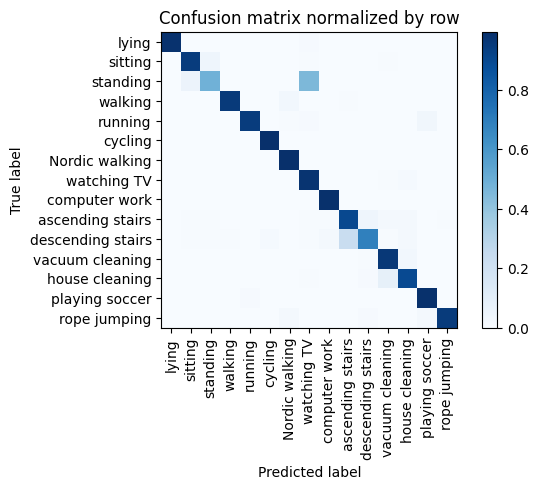

Training Epoch:  20%|██        | 3/15 [03:03<12:04, 60.37s/it]

Overall accuracy: 0.910

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.990      0.989      0.136        608|	 playing soccer: 0.003,	vacuum cleaning: 0.003,	
          walking       0.998      0.954      0.976      0.102        459|	 Nordic walking: 0.028,	ascending stairs: 0.004,	
   Nordic walking       0.960      0.995      0.977      0.086        386|	 house cleaning: 0.003,	vacuum cleaning: 0.003,	
         standing       0.903      0.486      0.632      0.086        385|	 watching TV: 0.455,	sitting: 0.057,	
            lying       1.000      0.986      0.993      0.082        366|	 watching TV: 0.008,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.897      0.961      0.928      0.081        361|	 house cleaning: 0.028,	descending stairs: 0.006,	
          sitting       0.922      0.946      0.934      0.078        349|	 standing: 0.043,	vacuum cleaning: 0.006,	
   house cleaning       0.926  


train: 100%|██████████| 283/283 [00:51<00:00,  5.50batch/s, loss=297, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.03batch/s, loss=303]


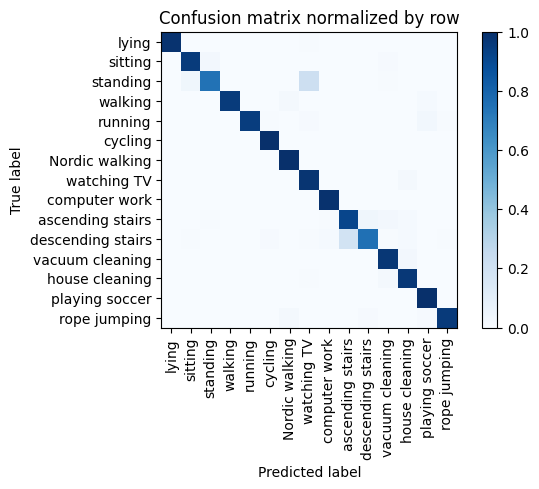

Training Epoch:  27%|██▋       | 4/15 [04:01<10:53, 59.40s/it]

Overall accuracy: 0.944

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.992      0.992      0.134        600|	 playing soccer: 0.003,	vacuum cleaning: 0.003,	
          walking       1.000      0.955      0.977      0.103        462|	 Nordic walking: 0.022,	playing soccer: 0.013,	
         standing       0.960      0.745      0.839      0.087        388|	 watching TV: 0.211,	sitting: 0.039,	
   Nordic walking       0.970      1.000      0.985      0.086        385|	 rope jumping: 0.000,	playing soccer: 0.000,	
            lying       0.997      0.986      0.992      0.081        365|	 watching TV: 0.005,	house cleaning: 0.003,	
  vacuum cleaning       0.939      0.972      0.955      0.081        362|	 house cleaning: 0.025,	computer work: 0.003,	
          sitting       0.949      0.955      0.952      0.079        354|	 standing: 0.025,	vacuum cleaning: 0.008,	
   house cleaning       0.935      0.966 


train: 100%|██████████| 283/283 [00:53<00:00,  5.25batch/s, loss=302, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.75batch/s, loss=278]


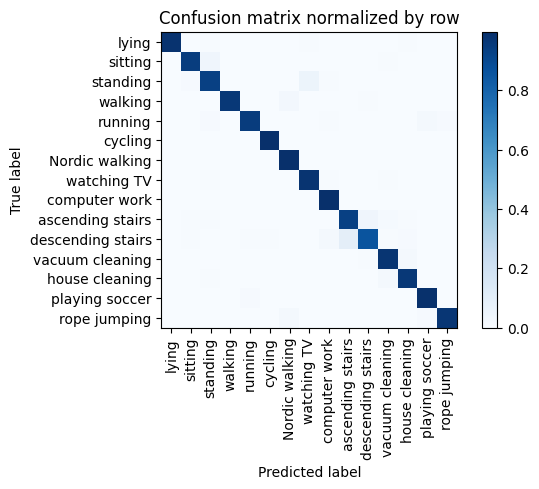

Training Epoch:  33%|███▎      | 5/15 [05:01<09:58, 59.90s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.995      0.991      0.135        604|	 vacuum cleaning: 0.003,	house cleaning: 0.002,	
          walking       0.998      0.965      0.981      0.101        453|	 Nordic walking: 0.024,	descending stairs: 0.004,	
   Nordic walking       0.968      0.997      0.982      0.087        391|	 house cleaning: 0.003,	rope jumping: 0.000,	
         standing       0.941      0.933      0.937      0.087        390|	 watching TV: 0.051,	sitting: 0.010,	
            lying       1.000      0.984      0.992      0.081        364|	 house cleaning: 0.005,	watching TV: 0.005,	
  vacuum cleaning       0.956      0.975      0.965      0.080        358|	 house cleaning: 0.017,	descending stairs: 0.006,	
          sitting       0.977      0.946      0.961      0.079        354|	 standing: 0.040,	vacuum cleaning: 0.006,	
   house cleaning       0.957     


train: 100%|██████████| 283/283 [00:54<00:00,  5.21batch/s, loss=287, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.25batch/s, loss=276]


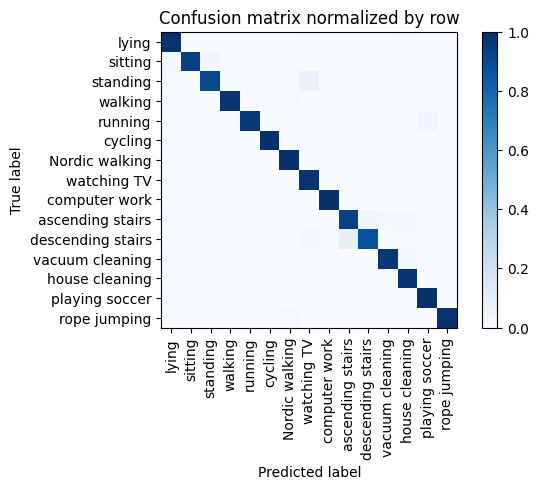

Training Epoch:  40%|████      | 6/15 [06:02<09:01, 60.16s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.997      0.998      0.136        608|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          walking       1.000      0.981      0.990      0.103        462|	 Nordic walking: 0.011,	playing soccer: 0.002,	
   Nordic walking       0.985      1.000      0.992      0.087        392|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.959      0.905      0.931      0.087        388|	 watching TV: 0.067,	sitting: 0.015,	
  vacuum cleaning       0.970      0.972      0.971      0.081        362|	 house cleaning: 0.028,	rope jumping: 0.000,	
            lying       0.970      0.989      0.979      0.081        362|	 house cleaning: 0.006,	watching TV: 0.006,	
          sitting       0.973      0.939      0.956      0.077        347|	 standing: 0.035,	lying: 0.017,	
   house cleaning       0.928      0.981      0.954   


train: 100%|██████████| 283/283 [00:53<00:00,  5.29batch/s, loss=271, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.42batch/s, loss=285]


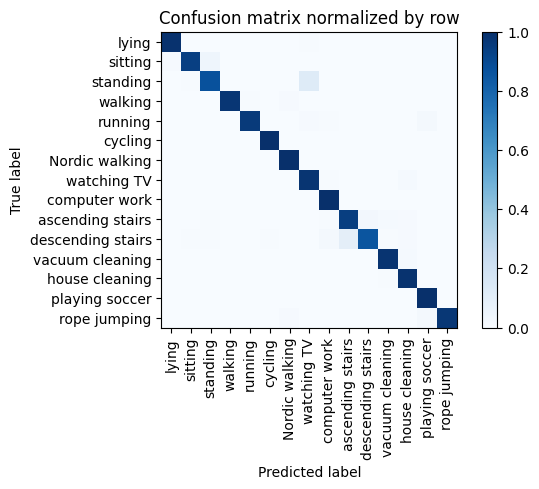

Training Epoch:  47%|████▋     | 7/15 [07:02<08:00, 60.05s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.997      0.993      0.135        606|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          walking       1.000      0.976      0.988      0.103        461|	 Nordic walking: 0.011,	running: 0.004,	
   Nordic walking       0.985      1.000      0.992      0.087        392|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.944      0.874      0.908      0.087        388|	 watching TV: 0.121,	sitting: 0.005,	
  vacuum cleaning       0.975      0.983      0.979      0.081        363|	 house cleaning: 0.014,	computer work: 0.003,	
            lying       0.992      0.992      0.992      0.081        362|	 watching TV: 0.006,	house cleaning: 0.003,	
          sitting       0.985      0.941      0.962      0.079        353|	 standing: 0.045,	lying: 0.008,	
   house cleaning       0.961      0.988      0.974      0.0


train: 100%|██████████| 283/283 [00:52<00:00,  5.43batch/s, loss=284, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.68batch/s, loss=268]


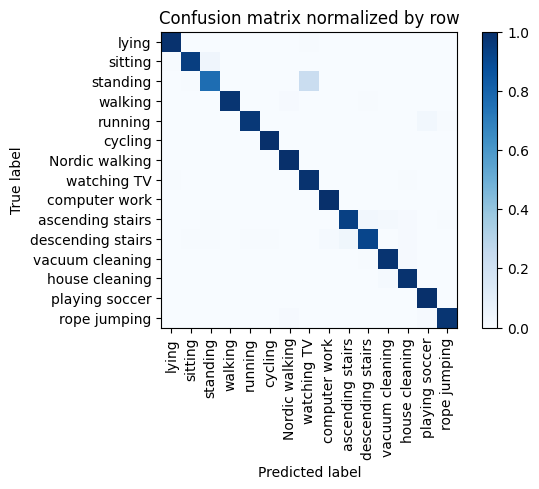

Training Epoch:  53%|█████▎    | 8/15 [08:01<06:57, 59.67s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.997      0.996      0.135        605|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          walking       1.000      0.978      0.989      0.102        458|	 Nordic walking: 0.009,	descending stairs: 0.004,	
   Nordic walking       0.987      1.000      0.994      0.088        394|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.949      0.765      0.847      0.087        391|	 watching TV: 0.230,	sitting: 0.005,	
            lying       0.992      0.992      0.992      0.081        363|	 watching TV: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.967      0.983      0.975      0.079        356|	 house cleaning: 0.011,	descending stairs: 0.006,	
          sitting       0.991      0.943      0.966      0.078        351|	 standing: 0.040,	lying: 0.006,	
   house cleaning       0.966      0.984      


train: 100%|██████████| 283/283 [00:53<00:00,  5.32batch/s, loss=272, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.86batch/s, loss=285]


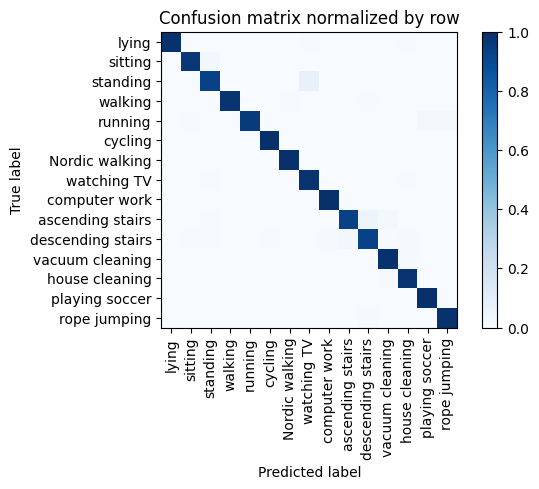

Training Epoch:  60%|██████    | 9/15 [09:01<05:58, 59.72s/it]

Overall accuracy: 0.977

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.997      0.996      0.134        601|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          walking       1.000      0.983      0.991      0.102        459|	 descending stairs: 0.007,	Nordic walking: 0.004,	
   Nordic walking       0.995      1.000      0.997      0.087        388|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.963      0.928      0.945      0.087        388|	 watching TV: 0.072,	rope jumping: 0.000,	
  vacuum cleaning       0.973      0.989      0.981      0.081        363|	 house cleaning: 0.008,	computer work: 0.003,	
            lying       1.000      0.989      0.994      0.081        363|	 house cleaning: 0.006,	watching TV: 0.006,	
          sitting       0.991      0.966      0.978      0.078        349|	 standing: 0.029,	house cleaning: 0.003,	
   house cleaning       0.970      0


train: 100%|██████████| 283/283 [00:55<00:00,  5.14batch/s, loss=281, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.04batch/s, loss=287]


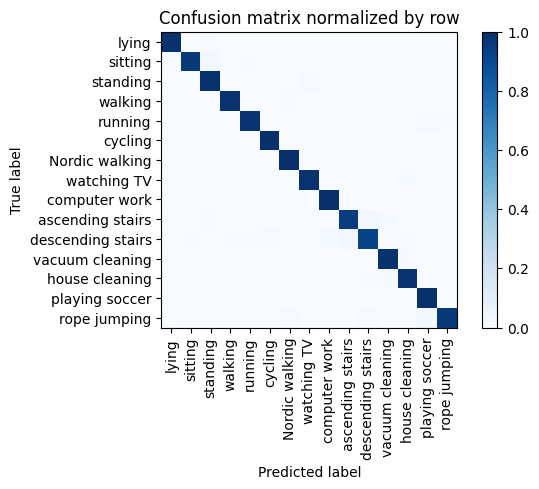

Training Epoch:  67%|██████▋   | 10/15 [10:02<05:01, 60.30s/it]

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.997      0.995      0.135        606|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          walking       0.998      0.987      0.992      0.102        455|	 Nordic walking: 0.007,	playing soccer: 0.002,	
   Nordic walking       0.990      1.000      0.995      0.087        389|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.970      0.990      0.980      0.087        388|	 watching TV: 0.010,	rope jumping: 0.000,	
            lying       0.994      0.992      0.993      0.081        361|	 standing: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.970      0.992      0.981      0.080        360|	 house cleaning: 0.006,	computer work: 0.003,	
          sitting       0.994      0.960      0.977      0.078        349|	 standing: 0.026,	running: 0.006,	
   house cleaning       0.981      0.981      0.9


train: 100%|██████████| 283/283 [00:52<00:00,  5.44batch/s, loss=267, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.17batch/s, loss=283]


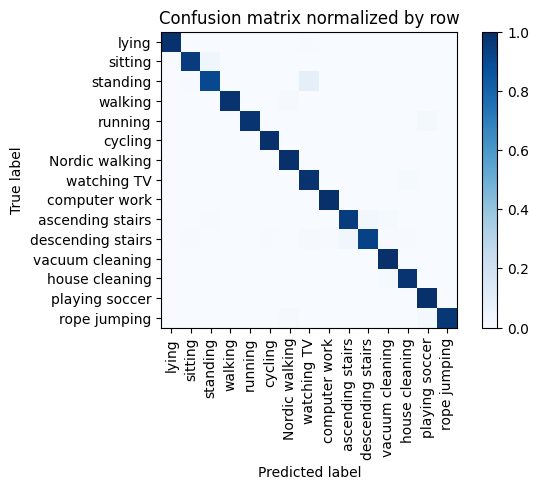

Training Epoch:  73%|███████▎  | 11/15 [11:01<03:59, 59.75s/it]

Overall accuracy: 0.977

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      1.000      0.999      0.135        607|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       1.000      0.985      0.992      0.102        456|	 Nordic walking: 0.009,	playing soccer: 0.002,	
   Nordic walking       0.987      1.000      0.994      0.087        392|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.962      0.905      0.933      0.087        390|	 watching TV: 0.090,	sitting: 0.005,	
            lying       0.994      0.992      0.993      0.081        364|	 watching TV: 0.005,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.970      0.997      0.983      0.079        354|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.991      0.951      0.971      0.078        350|	 standing: 0.037,	lying: 0.006,	
   house cleaning       0.988      0.978      0.983   


train: 100%|██████████| 283/283 [00:52<00:00,  5.42batch/s, loss=276, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.38batch/s, loss=306]


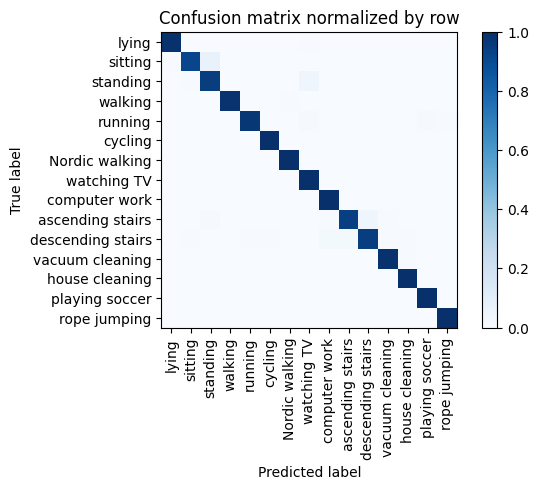

Training Epoch:  80%|████████  | 12/15 [11:59<02:58, 59.39s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      1.000      0.997      0.135        603|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       1.000      0.985      0.992      0.103        462|	 Nordic walking: 0.006,	rope jumping: 0.002,	
   Nordic walking       0.992      1.000      0.996      0.087        389|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.931      0.946      0.939      0.087        388|	 watching TV: 0.046,	sitting: 0.008,	
            lying       0.994      0.992      0.993      0.081        362|	 watching TV: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.989      0.992      0.990      0.081        361|	 house cleaning: 0.006,	standing: 0.003,	
          sitting       0.988      0.918      0.952      0.079        353|	 standing: 0.068,	lying: 0.006,	
   house cleaning       0.982      0.997      0.989      0.07


train: 100%|██████████| 283/283 [00:52<00:00,  5.36batch/s, loss=278, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.87batch/s, loss=266]


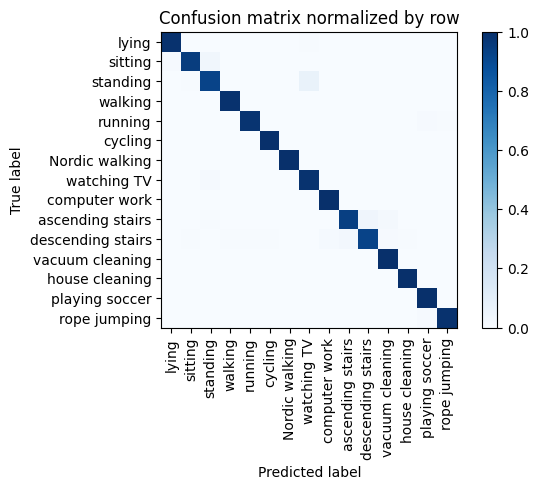

Training Epoch:  87%|████████▋ | 13/15 [12:58<01:58, 59.28s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      1.000      0.998      0.135        604|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.998      0.989      0.993      0.103        461|	 playing soccer: 0.002,	descending stairs: 0.002,	
   Nordic walking       0.997      1.000      0.999      0.087        392|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.957      0.923      0.940      0.087        389|	 watching TV: 0.069,	sitting: 0.008,	
            lying       0.986      0.992      0.989      0.080        360|	 watching TV: 0.006,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.978      0.997      0.988      0.080        358|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.988      0.949      0.968      0.079        352|	 standing: 0.034,	lying: 0.011,	
   house cleaning       0.994      0.997      0.995


train: 100%|██████████| 283/283 [00:52<00:00,  5.42batch/s, loss=251, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.49batch/s, loss=254]


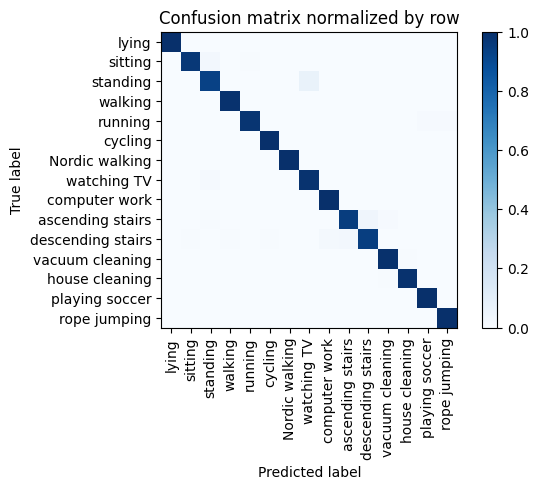

Training Epoch:  93%|█████████▎| 14/15 [13:57<00:59, 59.07s/it]

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      1.000      0.998      0.135        606|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.998      0.991      0.995      0.102        458|	 playing soccer: 0.002,	descending stairs: 0.002,	
   Nordic walking       0.997      1.000      0.999      0.087        391|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.968      0.930      0.949      0.086        387|	 watching TV: 0.067,	sitting: 0.003,	
            lying       1.000      0.997      0.999      0.081        361|	 house cleaning: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.986      0.994      0.990      0.080        359|	 house cleaning: 0.006,	rope jumping: 0.000,	
          sitting       0.994      0.966      0.980      0.078        351|	 standing: 0.026,	running: 0.006,	
   house cleaning       0.991      0.991      0.9


train: 100%|██████████| 283/283 [00:40<00:00,  7.07batch/s, loss=272, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:03<00:00, 19.35batch/s, loss=272]


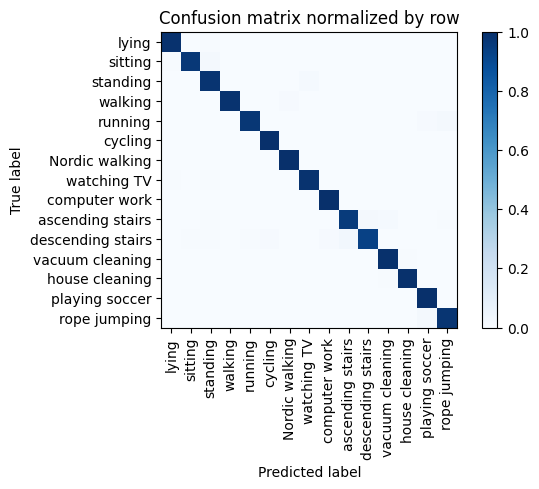

Overall accuracy: 0.986

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      1.000      0.998      0.136        608|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       1.000      0.987      0.993      0.103        461|	 Nordic walking: 0.009,	descending stairs: 0.002,	
   Nordic walking       0.990      1.000      0.995      0.087        392|	 rope jumping: 0.000,	playing soccer: 0.000,	
         standing       0.967      0.982      0.975      0.087        390|	 watching TV: 0.015,	sitting: 0.003,	
            lying       0.992      0.992      0.992      0.080        360|	 standing: 0.006,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.981      0.994      0.987      0.079        356|	 house cleaning: 0.006,	rope jumping: 0.000,	
          sitting       0.994      0.966      0.980      0.078        351|	 standing: 0.023,	lying: 0.006,	
   house cleaning       0.994      0.994      0.994   

unseen: 100%|██████████| 60/60 [00:02<00:00, 21.16batch/s, loss=357]


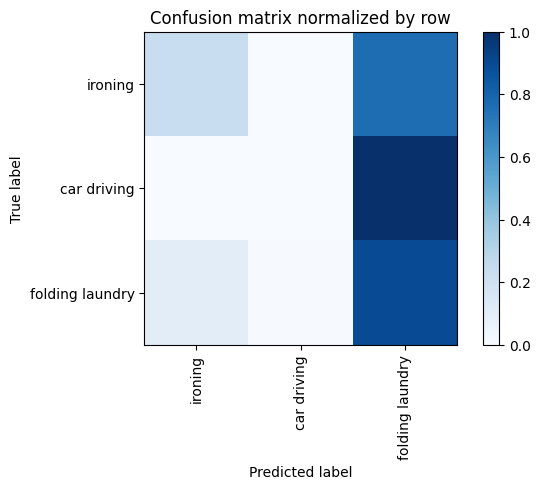

Overall accuracy: 0.367

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.844      0.233      0.365      0.607       2331|	 folding laundry: 0.764,	car driving: 0.003,	
folding laundry       0.272      0.892      0.417      0.253        972|	 ironing: 0.103,	car driving: 0.005,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.581      0.367      0.327        1.0       3840|	      

{'accuracy': 0.36692708333333335, 'precision': 0.372121606796088, 'recall': 0.3748311803867359, 'f1': 0.2605474280549962}
============== Overall Unseen Classes Performance ==============


accuracy     0.470694
precision    0.466410
recall       0.502022
f1           0.439831
dtype: float64

In [39]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(), 'feature': nn.MSELoss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
